## Data overview

In [1]:
#%config InlineBackend.figure_format = 'retina'

In [2]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import scipy as sp
from plotnine import *

from matplotlib import pyplot as plt
from statsmodels.stats.multitest import multipletests

In [3]:
import sys
from pathlib import Path

sys.path.append(str(Path.home() / 'Code/sctoolkit/'))

In [4]:
from sctoolkit.proportions import dirichletreg, get_proportions_per_channel, plot_proportion_barplot
from sctoolkit.utils import run_spring, sort_by_correlation

In [5]:
sc.set_figure_params(dpi=90)

sc.settings.figdir = 'figures/figure01'

In [6]:
adata = sc.read('AtopicDermatitis.h5ad')
adata

AnnData object with n_obs × n_vars = 280518 × 29991
    obs: '10x_cell_calling', 'G2M_score', 'S_score', 'barcode_rank', 'chemistry_10x', 'disease_status', 'empty_drops_FDR', 'ind_id', 'lesional', 'log10_n_genes', 'log10_n_umis', 'mito_cutoff_', 'mt_frac', 'n_counts', 'n_genes', 'n_umis', 'neg_log10_empty_drops_FDR', 'phase', 'predicted_cell_types', 'predicted_sex', 'raw', 'sample_name', 'scrublet', 'scrublet_score', 'sex', 'disease_lesional', 'batch', 'leiden', 'Cell type', 'Cell type granular', 'ind_sample', 'channel', 'barcode', 'subject_id', 'global_disease_assessment', 'ad_family_history', 'sex_clinical', 'childbearing_potential', 'ethnicity_race', 'smoking', 'asthma', 'other_condition', 'systemic_corticosteroids', 'topical_corticosteroids', 'dupilumab', 'dupilumab_indication', 'dupilumab_other_indication', 'location', 'side', 'Disease score (MADAD Immune)', 'Disease score (MADAD Full)', 'Disease score (MADAD Union)', 'Cell type new cornified', 'ind_disease_lesional'
    var: 'hig

In [ ]:
adata.obs[['Cell type', 'Cell type granular']].drop_duplicates()

In [7]:
adata.obs.head()

,10x_cell_calling,G2M_score,S_score,barcode_rank,chemistry_10x,disease_status,empty_drops_FDR,ind_id,lesional,log10_n_genes,...,dupilumab,dupilumab_indication,dupilumab_other_indication,location,side,Disease score (MADAD Immune),Disease score (MADAD Full),Disease score (MADAD Union),Cell type new cornified,ind_disease_lesional
TTTATGCCAATGCCAT-1-BCH01-NL2,False,-0.052357,-0.007142,8831.0,v2,AD,0.000119,BCH01,No,2.478566,...,nan,nan,nan,antecubital fossa,Left,0.010422,-0.037299,-0.028849,Fibroblasts,BCH01Non-lesional
CGAGAAGTCAATCTCT-1-BCH01-L1,False,-0.068563,0.011843,9482.0,v2,AD,0.000110,BCH01,Yes,2.419956,...,nan,nan,nan,antecubital fossa,Left,-0.052780,-0.016136,-0.017103,Fibroblasts,BCH01Lesional
AAACGGGAGTGTACCT-1-BCH01-NL1,True,-0.059810,-0.043785,6357.5,v2,AD,0.000000,BCH01,No,2.751279,...,nan,nan,nan,antecubital fossa,Left,-0.079817,-0.022076,-0.023166,Fibroblasts,BCH01Non-lesional
AAACGGGGTGTCTGAT-1-BCH01-NL1,True,-0.003011,-0.010870,5983.0,v2,AD,0.000000,BCH01,No,2.773786,...,nan,nan,nan,antecubital fossa,Left,-0.069483,-0.061896,-0.062982,Fibroblasts,BCH01Non-lesional
AAAGATGGTTGCGTTA-1-BCH01-NL1,True,-0.049785,0.000934,5503.5,v2,AD,0.000000,BCH01,No,2.809560,...,nan,nan,nan,antecubital fossa,Left,-0.101011,-0.077975,-0.078050,Fibroblasts,BCH01Non-lesional


In [8]:
#adata.obs['ind_cs']  = (adata.obs.ind_id.astype(str) + adata.obs['Cell states'].astype(str)).astype('category')
adata.obs['ind_disease_lesional']  = (adata.obs.ind_id.astype(str) + adata.obs.disease_lesional.astype(str)).astype('category')

## Descriptive figures

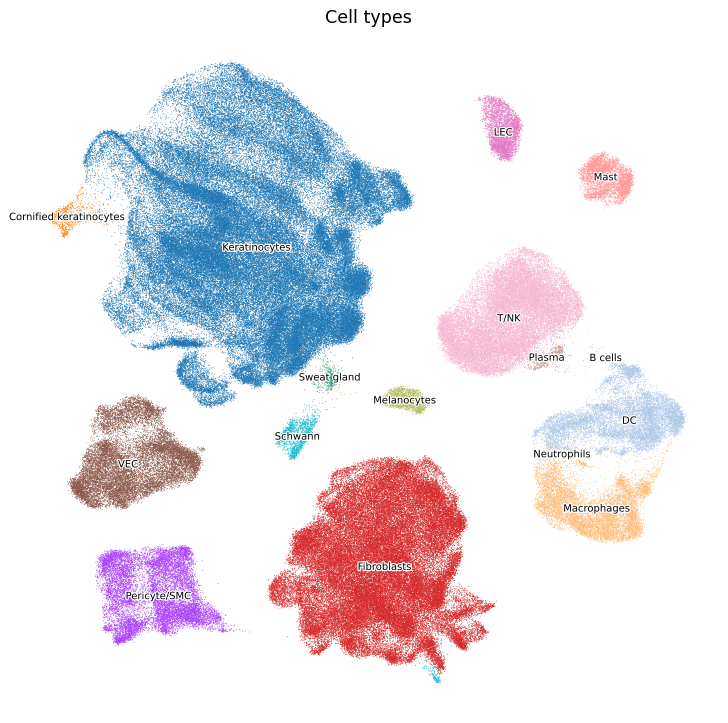

In [28]:
plt.rcParams['figure.figsize'] = (10,10)
sc.pl.umap(adata, color='Cell type', title='Cell types', save='celltypes.pdf', size=2, legend_loc='on data', legend_fontoutline=2, legend_fontsize=8, legend_fontweight='normal', frameon=False)
plt.rcParams['figure.figsize'] = (4,4)

In [29]:
#plt.rcParams['figure.figsize'] = (8,8)
#sc.pl.umap(adata, color='Cell type', title='Cell types')
#plt.rcParams['figure.figsize'] = (4,4)

## Cell states

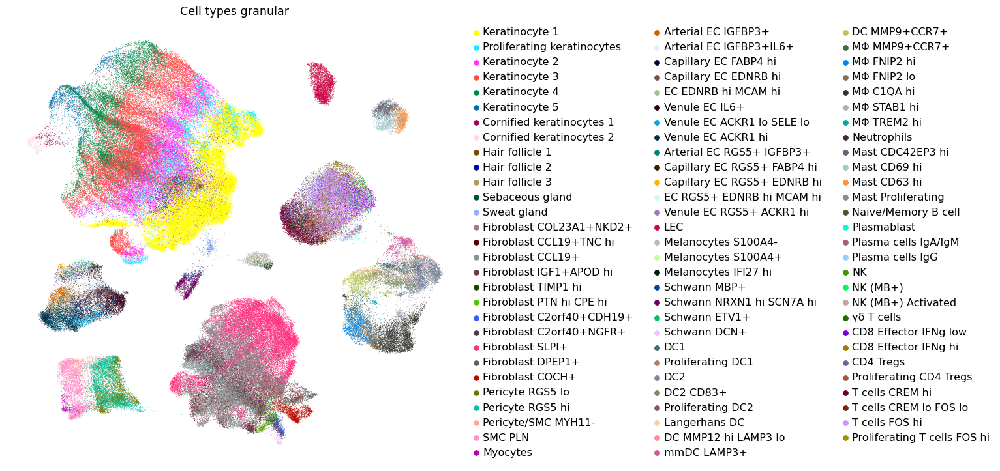

In [30]:
plt.rcParams['figure.figsize'] = (10,10)
sc.pl.umap(adata, color='Cell type granular', title='Cell types granular', save='celltypes-granular.pdf', size=2, frameon=False) #, legend_loc='on data', legend_fontoutline=2, legend_fontsize=8, legend_fontweight='normal')
plt.rcParams['figure.figsize'] = (4,4)

## General markers

In [9]:
%%time

adata.layers['scaled'] = adata.X.copy()
sc.pp.scale(adata, max_value=10, layer='scaled')

CPU times: user 1min 8s, sys: 43.9 s, total: 1min 52s
Wall time: 1min 52s


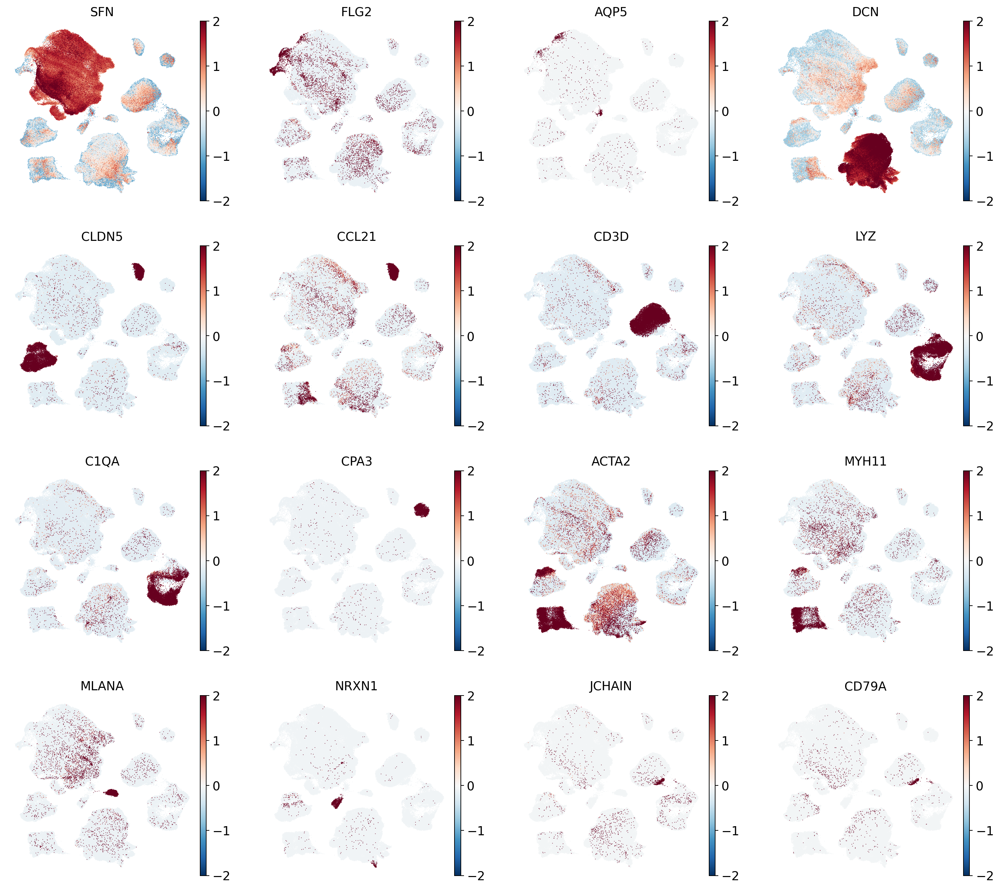

In [9]:
plt.rcParams['figure.figsize'] = (4,4)

sc.pl.umap(adata, color=['SFN', 'FLG2', 'AQP5', 'DCN', 'CLDN5', 'CCL21', 'CD3D', 
                         'LYZ', 'C1QA', 'CPA3', 'ACTA2', 'MYH11',
                         'MLANA', 'NRXN1', 'JCHAIN', 'CD79A'], cmap='RdBu_r', frameon=False, vmin=-2, vmax=2, layer='scaled',
           ncols=4, size=2, save='celltype_markers.pdf')

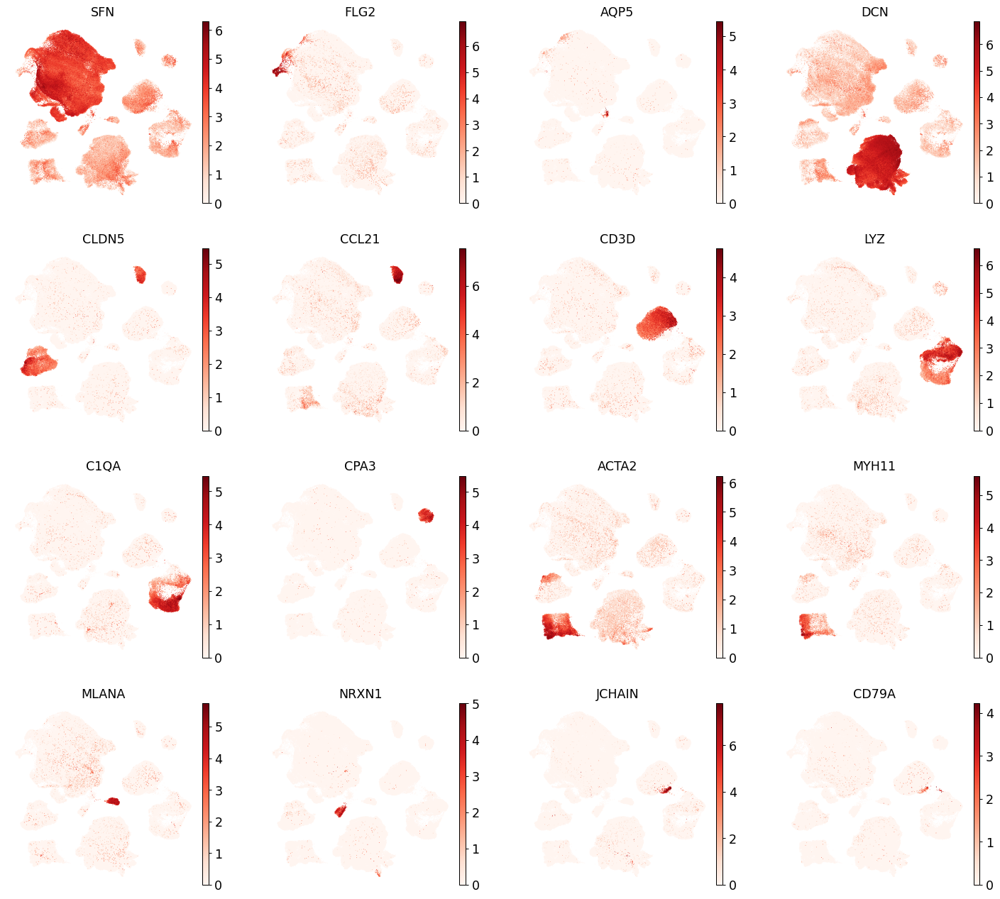

In [48]:
plt.rcParams['figure.figsize'] = (4,4)

sc.pl.umap(adata, color=['SFN', 'FLG2', 'AQP5', 'DCN', 'CLDN5', 'CCL21', 'CD3D', 
                         'LYZ', 'C1QA', 'CPA3', 'ACTA2', 'MYH11',
                         'MLANA', 'NRXN1', 'JCHAIN', 'CD79A'], cmap='Reds', frameon=False,
           ncols=4, size=2, save='celltype_markers_sepscale.pdf')

## Clustering

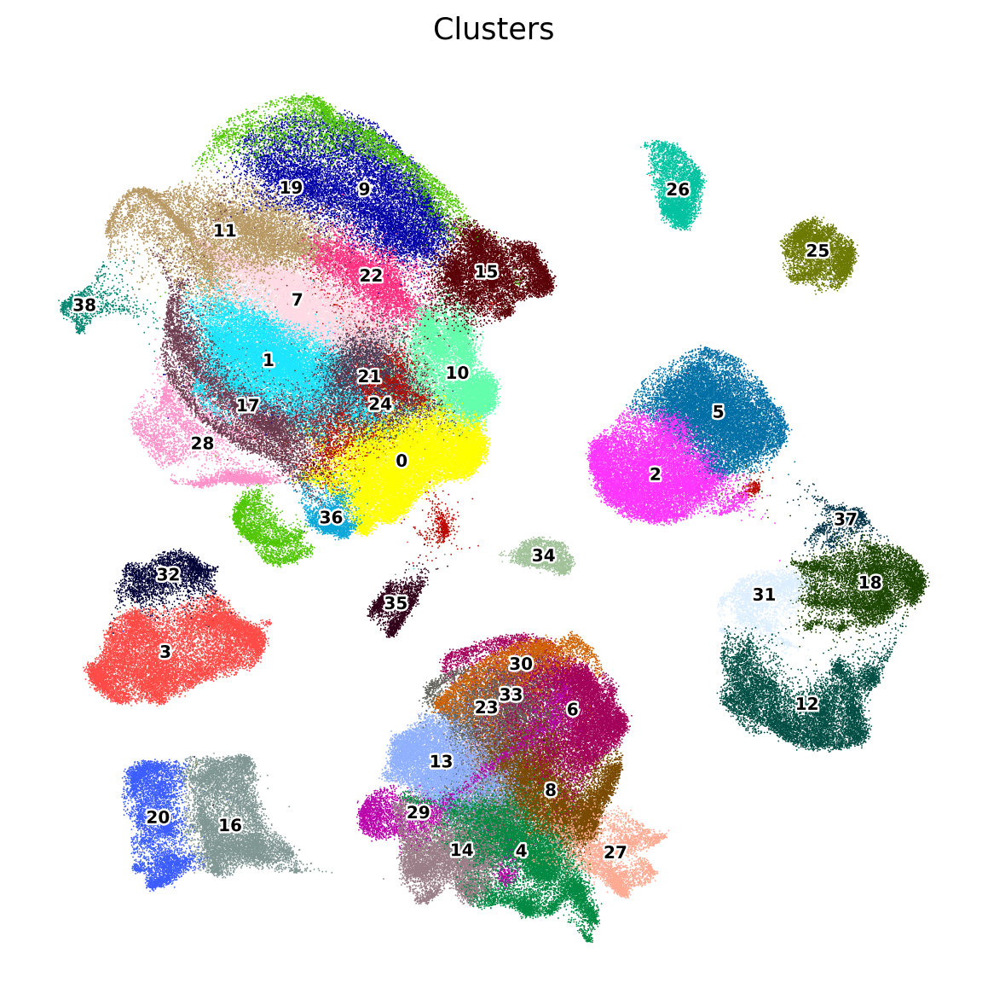

In [10]:
plt.rcParams['figure.figsize'] = (8,8)
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', legend_fontoutline=2, legend_fontsize=8, size=2, save='leiden.pdf', title='Clusters', frameon=False)
plt.rcParams['figure.figsize'] = (4,4)

## Disease status

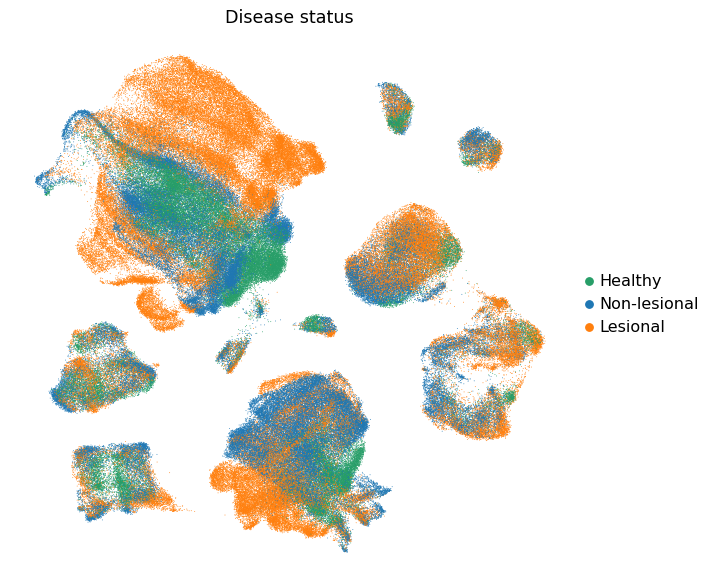

In [9]:
plt.rcParams['figure.figsize'] = (8,8)
sc.pl.umap(adata, color='disease_lesional', title='Disease status', save='disease_status.pdf', size=2, frameon=False)
plt.rcParams['figure.figsize'] = (4,4)

In [10]:
adata.obs.disease_lesional.value_counts()

Lesional        122826
Non-lesional     97947
Healthy          59745
Name: disease_lesional, dtype: int64

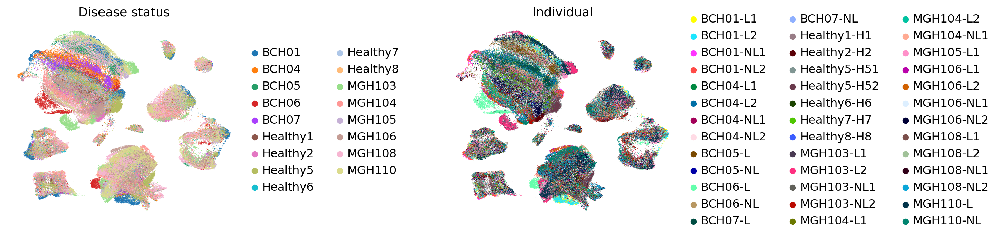

In [12]:
plt.rcParams['figure.figsize'] = (4,4)
sc.pl.umap(adata, color=['ind_id', 'channel'], title=['Disease status', 'Individual', 'Channel'], size=1, wspace=0.7, save='individuals-channels.pdf', frameon=False)
plt.rcParams['figure.figsize'] = (4,4)

In [10]:
len(adata.obs.ind_id.cat.categories)

17

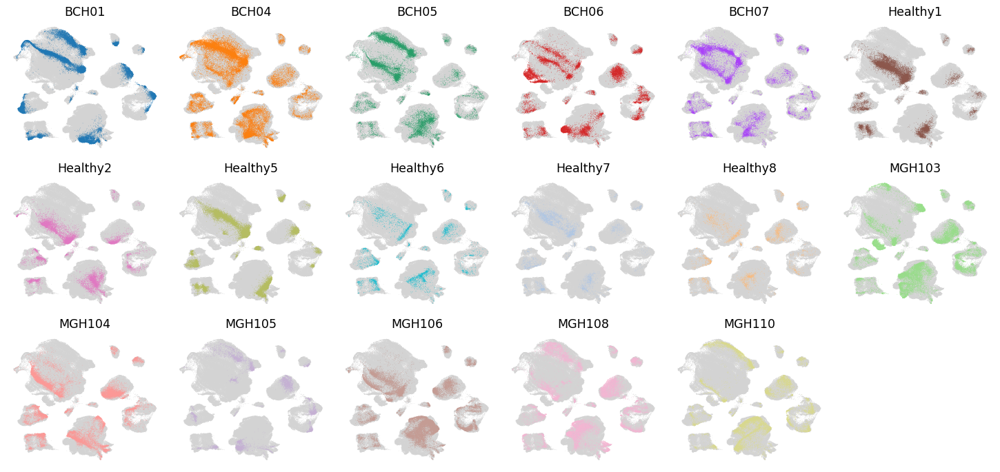

In [18]:
f, axs = plt.subplots(3, 6, figsize=(16,7.5), constrained_layout=True)
axs = axs.flat
for ax in axs[17:]:
    ax.remove()
axs = axs[:17]

for i, ax in zip(adata.obs.ind_id.cat.categories, axs):
    sc.pl.umap(adata, color='ind_id', title=i, size=1, frameon=False, ax=ax, show=False, groups=[i], legend_loc='none')
    
f.savefig('figures/figure01/individuals-split.pdf')

In [11]:
keep_cols = {
    'Subject ID:': 'subject_id', 
    'Global Disease Assessment:': 'global_disease_assessment',
    'Does the subject have a family history of the same condition?': 'ad_family_history', 
    'Sex:': 'sex_clinical', 
    'Is the subject of child-bearing potential?': 'childbearing_potential', 
    'Ethnicity/Race': 'ethnicity_race', 
    'Does the subject currently smoke?': 'smoking', 
    '6. Asthma': 'asthma',
    'If Other, please specify:.2': 'other_condition',
    '2. Systemic Corticosteroids': 'systemic_corticosteroids',
    '3. Topical Corticosteroids': 'topical_corticosteroids',
    '11. Dupilumab': 'dupilumab',
    'Dupilumab Indication:': 'dupilumab_indication',
    'If Other, please specify:.5': 'dupilumab_other_indication',
    'Location:': 'location',
    'Side:': 'side',
}

In [ ]:
sc.pl.umap(adata, color=keep_cols.values(), wspace=0.8, cmap='Reds')

## Spring markers

In [13]:
df = run_spring(adata, 'Cell type granular')

/home/gokcen/.miniconda3/lib/python3.8/site-packages/scrublet/helper_functions.py:175: RuntimeWarning: divide by zero encountered in true_divide


In [111]:
df.to_pickle('spring-granular.pkl')

In [56]:
df = pd.read_pickle('spring-granular.pkl')
df

,names,spring_score,group,hiscore,select,top10,top50,top30
0,COL17A1,1.786455,Keratinocyte 1,False,True,True,True,True
1,KRT15,1.736502,Keratinocyte 1,False,True,True,True,True
2,KRT14,1.611275,Keratinocyte 1,False,True,True,True,True
3,KRT5,1.601765,Keratinocyte 1,False,True,True,True,True
4,S100A2,1.514257,Keratinocyte 1,False,True,True,True,True
...,...,...,...,...,...,...,...,...
2579221,GOLGA8T,NaN,Proliferating T cells FOS hi,False,False,False,False,False
2579222,RP11-335O13.7,NaN,Proliferating T cells FOS hi,False,False,False,False,False
2579223,RP5-1027O15.1,NaN,Proliferating T cells FOS hi,False,False,False,False,False
2579224,AL591806.1,NaN,Proliferating T cells FOS hi,False,False,False,False,False


In [57]:
df['hiscore'] = df.spring_score>4

df['top10'] = False
df.top10.loc[df.groupby('group').head(10).index] = True

df['top30'] = False
df.top30.loc[df.groupby('group').head(15).index] = True

df['select'] = (df.hiscore & df.top30) | df.top10

print(df.names.nunique())
df.head(20)

/home/gokcen/.miniconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


29991


,names,spring_score,group,hiscore,select,top10,top50,top30
0,COL17A1,1.786455,Keratinocyte 1,False,True,True,True,True
1,KRT15,1.736502,Keratinocyte 1,False,True,True,True,True
2,KRT14,1.611275,Keratinocyte 1,False,True,True,True,True
3,KRT5,1.601765,Keratinocyte 1,False,True,True,True,True
4,S100A2,1.514257,Keratinocyte 1,False,True,True,True,True
5,DST,1.428063,Keratinocyte 1,False,True,True,True,True
6,SYT8,1.398387,Keratinocyte 1,False,True,True,True,True
7,HOPX,1.027613,Keratinocyte 1,False,True,True,True,True
8,LAMB3,1.004794,Keratinocyte 1,False,True,True,True,True
9,CXCL14,0.967023,Keratinocyte 1,False,True,True,True,True


In [59]:
#genes = {k:df[(df.group==k) & (df['select'])].names.values.tolist() for k in adata.obs['Cell type granular'].cat.categories}
genes = df[df.select].names.values.tolist()

In [63]:
df[df.select].to_excel('spring_heatmap_genes.xlsx', index=False)

In [ ]:
f = sc.pl.matrixplot(adata, genes, cmap='RdBu_r', layer='scaled', vmin=-2, vmax=2, dendrogram=False, groupby='Cell type granular', figsize=(24, 20), return_fig=True, show=False, colorbar_title='log(TP10K+1)\nmean Z-score')
f.style(cmap='RdBu_r', edge_lw=0, edge_color='none').savefig('figures/figure01/matrixplot_celltypegranular.pdf')
f.style(cmap='RdBu_r', edge_lw=0, edge_color='none').savefig('figures/figure01/matrixplot_celltypegranular.png')

In [109]:
#sc.pl.heatmap(adata, genes, figsize=(30,30), show_gene_labels=True, cmap='RdBu_r', layer='scaled', vmin=-2, vmax=2, dendrogram=False, groupby='Cell type granular', save='celltypegranular.pdf')

## Rank genes

In [ ]:
sc.tl.rank_genes_groups(adata, groupby='Cell type', use_raw=False)

In [ ]:
sc.pl.rank_genes_groups(adata, sharey=False)

In [16]:
import seaborn as sns

gradients = [list(sns.color_palette("Greens", n_colors=7).as_hex()), list(sns.color_palette("Blues", n_colors=15).as_hex()), list(sns.color_palette("Oranges", n_colors=17).as_hex())]
gradients = [x for y in gradients for x in y]
gradients

['#e5f5e0',
 '#c7e9c0',
 '#a0d99b',
 '#73c476',
 '#40aa5d',
 '#228a44',
 '#006c2c',
 '#eaf3fb',
 '#deebf7',
 '#d2e3f3',
 '#c6dbef',
 '#b2d2e8',
 '#9dcae1',
 '#84bcdb',
 '#6aaed6',
 '#56a0ce',
 '#4191c6',
 '#3181bd',
 '#2070b4',
 '#1460a8',
 '#08509b',
 '#084082',
 '#ffeede',
 '#fee8d2',
 '#fedfc0',
 '#fdd5ad',
 '#fdc895',
 '#fdb97d',
 '#fdab66',
 '#fd9c51',
 '#fd8c3b',
 '#f87d29',
 '#f26d17',
 '#e95e0d',
 '#de5005',
 '#cd4401',
 '#b63c02',
 '#a13403',
 '#902e04']

In [17]:
adata.uns['channel_colors'] = gradients

normalizing by a factor that is not plotted, please make sure you want to do that.


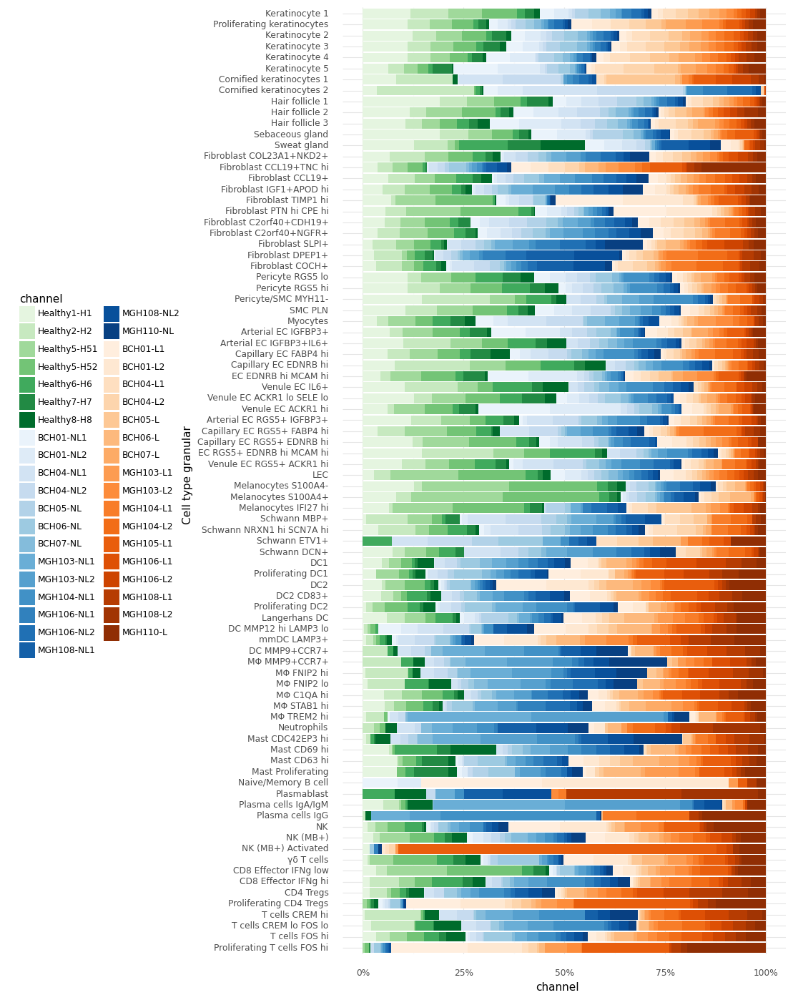

<ggplot: (8763924872644)>

In [18]:
g, df = plot_proportion_barplot(adata, 'Cell type granular', 'channel', normalize_by='disease_lesional', return_df=True, height_scale=0.5, show_percent=False)
g

In [23]:
ggsave(g, 'figures/figure01/proportion-cellstate-by-channel-gradient-barplots.pdf')

/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:727: PlotnineWarning: Saving 8.0 x 17.2 in image.
/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/figure01/proportion-cellstate-by-channel-gradient-barplots.pdf


## QC

In [24]:
nln = {'Healthy': 0, 'Non-lesional': 1, 'Lesional': 2}
channel_map = adata.obs[['channel', 'disease_lesional']].drop_duplicates().reset_index(drop=True).set_index('channel').disease_lesional.to_dict()
adata.uns['channel_colors'] = [adata.uns['disease_lesional_colors'][nln[channel_map[x]]] for x in adata.obs.channel.cat.categories]

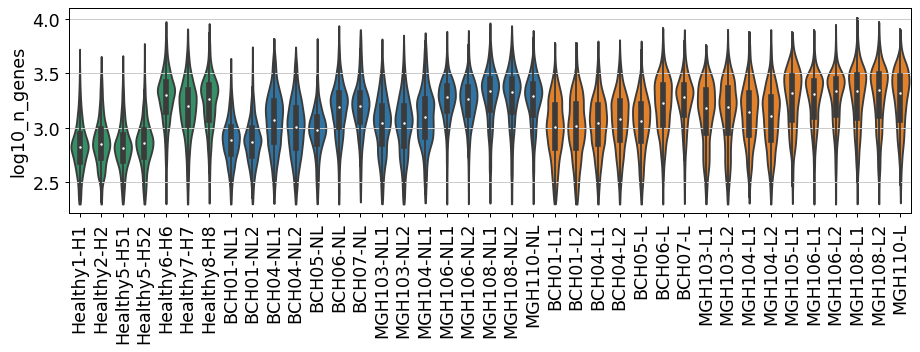

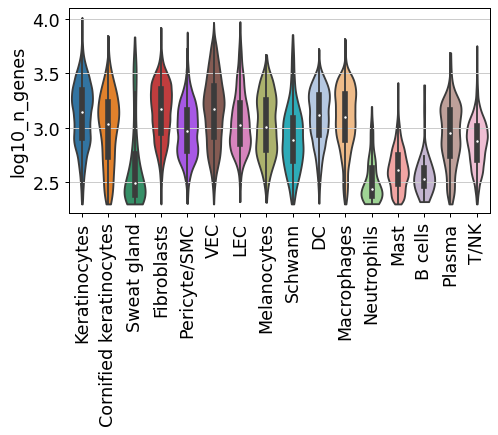

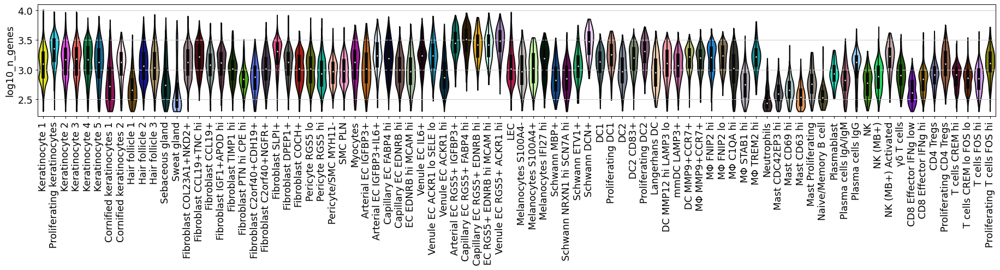

In [25]:
f, ax = plt.subplots(figsize=(12,3))
sc.pl.violin(adata, 'log10_n_genes', groupby='channel', ax=ax, rotation=90, stripplot=False, inner='box', save='-ngenes-channel.pdf')
#ax.set_yscale('log')

f, ax = plt.subplots(figsize=(6,3))
sc.pl.violin(adata, 'log10_n_genes', groupby='Cell type', ax=ax, rotation=90, stripplot=False, inner='box', save='-ngenes-ctbroad.pdf')
#ax.set_yscale('log')

f, ax = plt.subplots(figsize=(25,3))
sc.pl.violin(adata, 'log10_n_genes', groupby='Cell type granular', ax=ax, rotation=90, stripplot=False, inner='box', save='-ngenes-ctgran.pdf')
#ax.set_yscale('log')

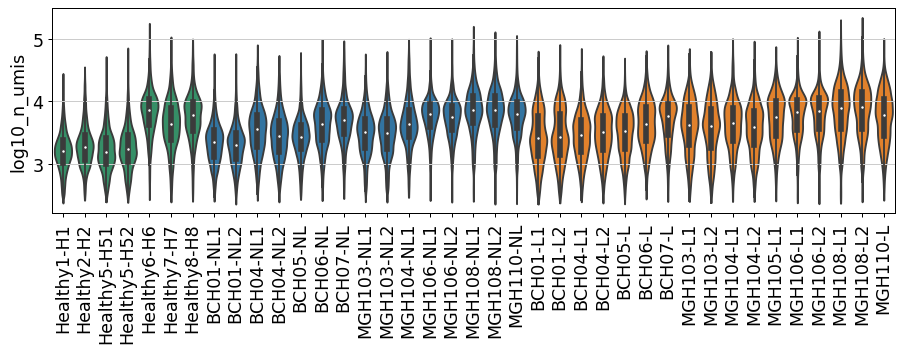

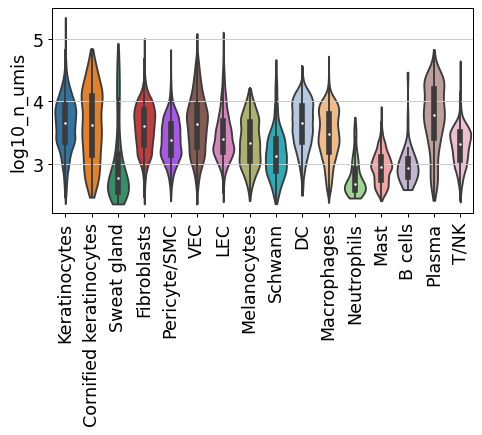

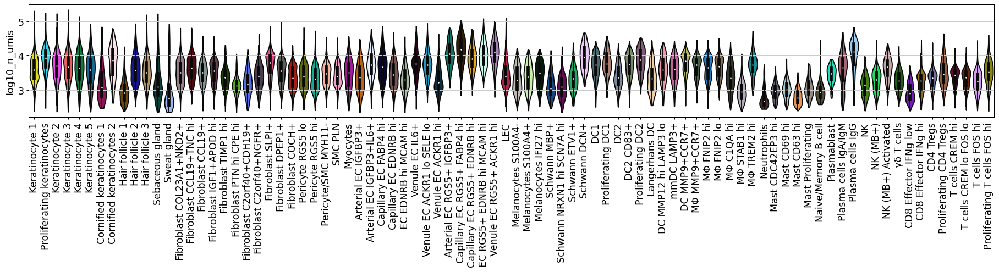

In [26]:
f, ax = plt.subplots(figsize=(12,3))
sc.pl.violin(adata, 'log10_n_umis', groupby='channel', ax=ax, rotation=90, stripplot=False, inner='box', save='-numis-channel.pdf')
#ax.set_yscale('log')

f, ax = plt.subplots(figsize=(6,3))
sc.pl.violin(adata, 'log10_n_umis', groupby='Cell type', ax=ax, rotation=90, stripplot=False, inner='box', save='-numis-ctbroad.pdf')
#ax.set_yscale('log')

f, ax = plt.subplots(figsize=(25,3))
sc.pl.violin(adata, 'log10_n_umis', groupby='Cell type granular', ax=ax, rotation=90, stripplot=False, inner='box', save='-numis-ctgran.pdf')
#ax.set_yscale('log')

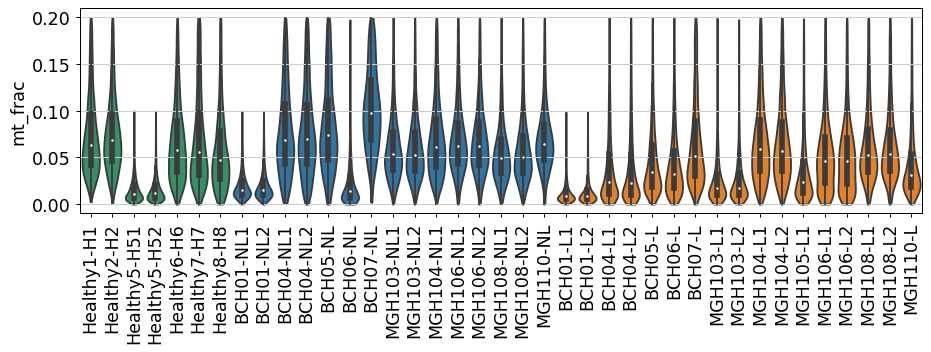

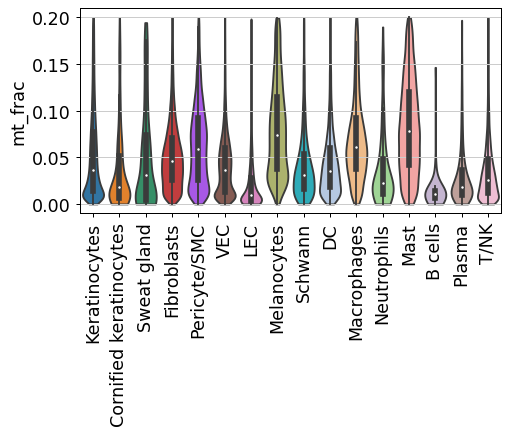

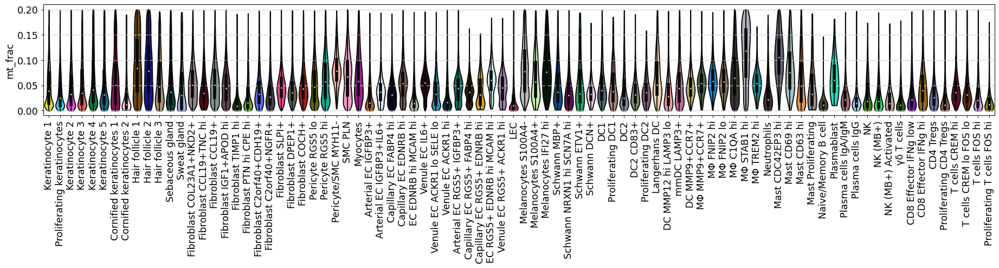

In [27]:
f, ax = plt.subplots(figsize=(12,3))
sc.pl.violin(adata, 'mt_frac', groupby='channel', ax=ax, rotation=90, stripplot=False, inner='box', save='-mitopercent-channel.pdf')

f, ax = plt.subplots(figsize=(6,3))
sc.pl.violin(adata, 'mt_frac', groupby='Cell type', ax=ax, rotation=90, stripplot=False, inner='box', save='-mitopercent-ctbroad.pdf')

f, ax = plt.subplots(figsize=(25,3))
sc.pl.violin(adata, 'mt_frac', groupby='Cell type granular', ax=ax, rotation=90, stripplot=False, inner='box', save='-mitopercent-ctgran.pdf')

## Granular cell type correlations

In [19]:
#pd.options.display.max_rows = 100

In [20]:
prop_df, covar_df = get_proportions_per_channel(adata[adata.obs.disease_lesional == 'Lesional'], 'channel', 'Cell type granular', ['mt_frac', 'ind_id'])

In [21]:
corr_df = prop_df.corr('spearman')

In [ ]:
series = corr_df.loc['Proliferating T cells FOS hi'].sort_values(ascending=False)
series[series>0.75].plot(kind='bar', figsize=(12,3))

In [ ]:
corr_df.loc['mmDC LAMP3+'].sort_values(ascending=False).plot(kind='bar', figsize=(25,3))

In [ ]:
corr_df.loc['CD4 Tregs'].sort_values(ascending=False).plot(kind='bar', figsize=(25,3))

In [ ]:
corr_df.loc['Fibroblast CCL19+TNC hi'].sort_values(ascending=False).plot(kind='bar', figsize=(25,3))

In [ ]:
f = sns.clustermap(corr_df, figsize=(40,40), vmin=-1, cmap='RdBu_r')
f

In [28]:
f.savefig(sc.settings.figdir / 'celltypecorrelations.pdf')

## cell type correlations with all cells

In [6]:
pd.options.display.max_rows = 100

In [7]:
prop_df, covar_df = get_proportions_per_channel(adata, 'channel', 'Cell type granular', ['mt_frac', 'ind_id'])

In [21]:
corr_df = prop_df.corr('spearman')

In [ ]:
series = corr_df.loc['Proliferating T cells FOS hi'].sort_values(ascending=False)
series[series>0.5].plot(kind='bar', figsize=(12,3))

In [ ]:
corr_df.loc['mmDC LAMP3+'].sort_values(ascending=False).plot(kind='bar', figsize=(25,3))

In [ ]:
corr_df.loc['CD4 Tregs'].sort_values(ascending=False).plot(kind='bar', figsize=(25,3))

In [ ]:
corr_df.loc['NK (MB+) Activated'].sort_values(ascending=False).plot(kind='bar', figsize=(25,3))

In [ ]:
corr_df.loc['Fibroblast CCL19+TNC hi'].sort_values(ascending=False).plot(kind='bar', figsize=(25,3))

In [ ]:
sns.clustermap(corr_df, figsize=(40,40), vmin=-1, cmap='RdBu_r')

In [314]:
del adata.uns['channel_colors']

In [320]:
adata.obs.channel.cat.categories

Index(['Healthy1-H1', 'Healthy2-H2', 'Healthy5-H51', 'Healthy5-H52',
       'Healthy6-H6', 'Healthy7-H7', 'Healthy8-H8', 'BCH01-NL1', 'BCH01-NL2',
       'BCH04-NL1', 'BCH04-NL2', 'BCH05-NL', 'BCH06-NL', 'BCH07-NL',
       'MGH103-NL1', 'MGH103-NL2', 'MGH104-NL1', 'MGH106-NL1', 'MGH106-NL2',
       'MGH108-NL1', 'MGH108-NL2', 'MGH110-NL', 'BCH01-L1', 'BCH01-L2',
       'BCH04-L1', 'BCH04-L2', 'BCH05-L', 'BCH06-L', 'BCH07-L', 'MGH103-L1',
       'MGH103-L2', 'MGH104-L1', 'MGH104-L2', 'MGH105-L1', 'MGH106-L1',
       'MGH106-L2', 'MGH108-L1', 'MGH108-L2', 'MGH110-L'],
      dtype='object')

plt.rcParams['figure.figsize'] = (8,8)
sc.pl.umap(adata, color=['channel'], legend_fontoutline=2, groups=['BCH04-L1', 'BCH04-L2'], legend_fontsize=8, size=2)
plt.rcParams['figure.figsize'] = (4,4)

plt.rcParams['figure.figsize'] = (8,8)
sc.pl.umap(adata, color=['channel'], legend_fontoutline=2, groups=['MGH104-L1', 'MGH104-L2'], legend_fontsize=8, size=2)
plt.rcParams['figure.figsize'] = (4,4)

plt.rcParams['figure.figsize'] = (8,8)
sc.pl.umap(adata, color=['channel'], legend_fontoutline=2, groups=['BCH07-L'], legend_fontsize=8, size=2)
plt.rcParams['figure.figsize'] = (4,4)


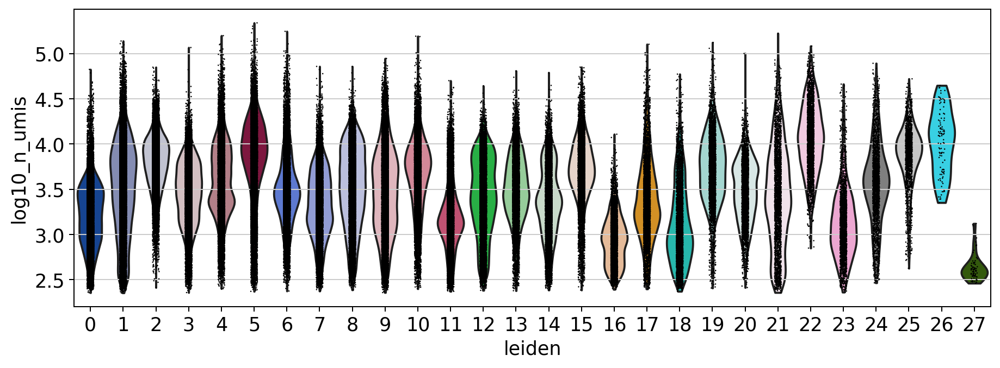

In [16]:
f, ax = plt.subplots(figsize=(12,4))
sc.pl.violin(adata, keys=['log10_n_umis'], groupby='leiden', ax=ax)

## Cell counts

In [31]:
counts = pd.DataFrame(adata.obs.groupby(['channel', 'disease_lesional'], observed=True).size(), columns=['cells']).reset_index()
counts['disease_lesional'] = pd.Categorical(counts['disease_lesional'], categories=['Healthy', 'Non-lesional', 'Lesional'], ordered=True)
counts = counts.sort_values(['disease_lesional', 'channel']).reset_index(drop=True)

channel_order = counts.channel.tolist()

adata.obs['channel'] = pd.Categorical(adata.obs['channel'], categories=channel_order)

adata.uns['disease_lesional_colors'] = ['#279e68', '#1f77b4', '#ff7f0e']

/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:727: PlotnineWarning: Saving 10 x 4 in image.
/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: figures/cellcounts-perchannel.pdf


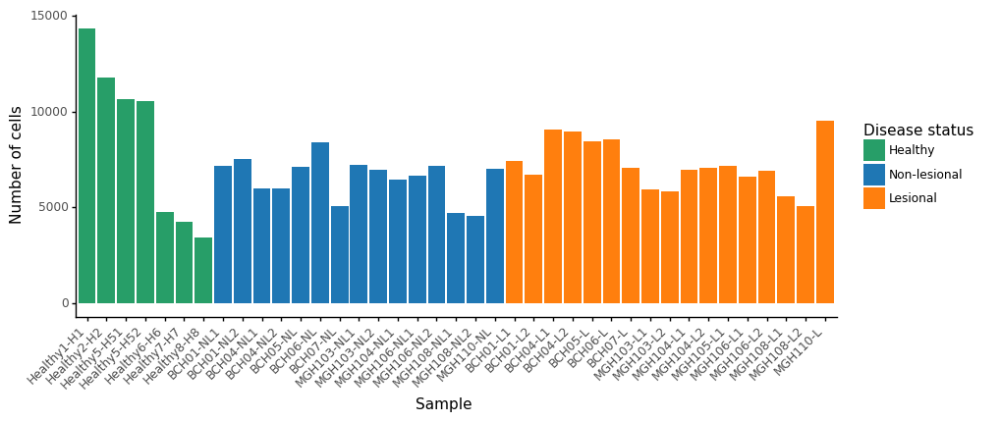

<ggplot: (8767534578411)>

In [32]:
counts['channel'] = pd.Categorical(counts['channel'].values,
                                   categories=counts[['channel']].drop_duplicates().channel.astype(str), ordered=True)

g = (qplot(data=counts, x='channel', y='cells', geom='bar', stat='identity', fill='disease_lesional') + 
 theme_classic() + labs(x='Sample', y='Number of cells') +
 theme(axis_text_x = element_text(angle = 45, hjust = 1.,  vjust=1), figure_size=(10,4))  +  scale_fill_manual(values=adata.uns['disease_lesional_colors'])) + labs(fill='Disease status')

ggsave(g, 'figures/cellcounts-perchannel.pdf')

g

## Within- between-sample correlations

In [75]:
adata

AnnData object with n_obs × n_vars = 280518 × 29991
    obs: '10x_cell_calling', 'G2M_score', 'S_score', 'barcode_rank', 'chemistry_10x', 'disease_status', 'empty_drops_FDR', 'ind_id', 'lesional', 'log10_n_genes', 'log10_n_umis', 'mito_cutoff_', 'mt_frac', 'n_counts', 'n_genes', 'n_umis', 'neg_log10_empty_drops_FDR', 'phase', 'predicted_cell_types', 'predicted_sex', 'raw', 'sample_name', 'scrublet', 'scrublet_score', 'sex', 'disease_lesional', 'batch', 'leiden', 'Cell type', 'Cell type granular', 'ind_sample', 'channel', 'barcode', 'subject_id', 'global_disease_assessment', 'ad_family_history', 'sex_clinical', 'childbearing_potential', 'ethnicity_race', 'smoking', 'asthma', 'other_condition', 'systemic_corticosteroids', 'topical_corticosteroids', 'dupilumab', 'dupilumab_indication', 'dupilumab_other_indication', 'location', 'side', 'Disease score (MADAD Immune)', 'Disease score (MADAD Full)', 'Disease score (MADAD Union)', 'Cell type new cornified', 'ind_disease_lesional'
    var: 'hig

In [172]:
prop_df = get_proportions_per_channel(adata, 'channel', 'Cell type granular', covariates=['disease_lesional', 'ind_id'])
prop_df = pd.concat([prop_df[0], prop_df[1]], axis=1).reset_index().set_index('disease_lesional')

In [178]:
prop_df_h  = prop_df.loc['Healthy'].set_index('ind_id')
prop_df_l  = prop_df.loc['Lesional'].set_index('ind_id')
prop_df_nl  = prop_df.loc['Non-lesional'].set_index('ind_id')

prop_df_h

,channel,Keratinocyte 1,Proliferating keratinocytes,Keratinocyte 2,Keratinocyte 3,Keratinocyte 4,Keratinocyte 5,Cornified keratinocytes 1,Cornified keratinocytes 2,Hair follicle 1,...,NK (MB+) Activated,γδ T cells,CD8 Effector IFNg low,CD8 Effector IFNg hi,CD4 Tregs,Proliferating CD4 Tregs,T cells CREM hi,T cells CREM lo FOS lo,T cells FOS hi,Proliferating T cells FOS hi
ind_id,,,,,,,,,,,,,,,,,,,,,
Healthy1,Healthy1-H1,0.212825,0.035866,0.106692,0.157421,0.066290,0.006350,0.000907,0.000907,0.023097,...,0.00007,0.000209,0.001954,0.001465,0.002093,0.000000,0.000907,0.001954,0.013956,0.000000
Healthy2,Healthy2-H2,0.203071,0.021206,0.060226,0.099160,0.041310,0.004750,0.001866,0.007465,0.009925,...,0.00000,0.000085,0.002036,0.007380,0.006532,0.000000,0.035202,0.012893,0.017644,0.000000
Healthy5,Healthy5-H51,0.204164,0.023727,0.074557,0.110569,0.037982,0.004314,0.000000,0.000000,0.010973,...,0.00000,0.001313,0.012098,0.004408,0.001969,0.000281,0.000844,0.000281,0.024008,0.000094
Healthy5,Healthy5-H52,0.212412,0.023760,0.069949,0.110720,0.036780,0.003611,0.000000,0.000095,0.010929,...,0.00000,0.002471,0.015396,0.004847,0.003516,0.000190,0.001331,0.000285,0.024140,0.000190
Healthy6,Healthy6-H6,0.102054,0.011945,0.035205,0.071878,0.017184,0.003562,0.000000,0.000838,0.005239,...,0.00000,0.002096,0.005239,0.019489,0.006077,0.000210,0.001886,0.012783,0.048407,0.000000
Healthy7,Healthy7-H7,0.142756,0.020966,0.103180,0.201649,0.054888,0.015783,0.000000,0.000471,0.021908,...,0.00000,0.001649,0.006360,0.007303,0.002827,0.000471,0.000000,0.000707,0.026384,0.000236
Healthy8,Healthy8-H8,0.110429,0.009056,0.044990,0.086766,0.021618,0.001753,0.000584,0.000292,0.005259,...,0.00000,0.002629,0.002045,0.011101,0.019573,0.000876,0.032136,0.028046,0.082968,0.000000


In [222]:
corrs_h_between = []
corrs_h_within = []

healthy_corr = prop_df_h.reset_index().set_index(['ind_id', 'channel']).T.corr('spearman')

for ind in prop_df_h.index.unique():
    between = healthy_corr.loc[ind].drop(ind, axis=1).values.flatten()
    corrs_h_between.extend(between.tolist())
        
    cormat = healthy_corr.loc[ind, ind].values
    within = cormat[np.triu_indices_from(cormat, k=1)]
    corrs_h_within.extend(within.tolist())

In [225]:
corrs_nl_between = []
corrs_nl_within = []

nl_corr = prop_df_nl.reset_index().set_index(['ind_id', 'channel']).T.corr('spearman')

for ind in prop_df_nl.index.unique():
    between = nl_corr.loc[ind].drop(ind, axis=1).values.flatten()
    corrs_nl_between.extend(between.tolist())
        
    cormat = nl_corr.loc[ind, ind].values
    within = cormat[np.triu_indices_from(cormat, k=1)]
    corrs_nl_within.extend(within.tolist())

In [229]:
corrs_l_between = []
corrs_l_within = []

l_corr = prop_df_l.reset_index().set_index(['ind_id', 'channel']).T.corr('spearman')

for ind in prop_df_l.index.unique():
    between = l_corr.loc[ind].drop(ind, axis=1).values.flatten()
    corrs_l_between.extend(between.tolist())
        
    cormat = l_corr.loc[ind, ind].values
    within = cormat[np.triu_indices_from(cormat, k=1)]
    corrs_l_within.extend(within.tolist())

In [242]:
cor_df = pd.concat([
    pd.DataFrame(dict(corr=dict(between=corrs_h_between, within=corrs_h_within))).explode('corr').reset_index().rename(columns={'index': 'bw'}).assign(disease_lesional='Healthy'),
    pd.DataFrame(dict(corr=dict(between=corrs_nl_between, within=corrs_nl_within))).explode('corr').reset_index().rename(columns={'index': 'bw'}).assign(disease_lesional='Non-lesional'),
    pd.DataFrame(dict(corr=dict(between=corrs_l_between, within=corrs_l_within))).explode('corr').reset_index().rename(columns={'index': 'bw'}).assign(disease_lesional='Lesional'),    
])

cor_df['corr'] = cor_df['corr'].astype(float)
cor_df['disease_lesional'] = pd.Categorical(cor_df['disease_lesional'], categories=adata.obs.disease_lesional.cat.categories.tolist())
cor_df['bw'] = pd.Categorical(cor_df['bw'], categories=['within', 'between'])
cor_df

,bw,corr,disease_lesional
0,between,0.760525,Healthy
1,between,0.880632,Healthy
2,between,0.873655,Healthy
3,between,0.844017,Healthy
4,between,0.909488,Healthy
...,...,...,...
261,within,0.973240,Lesional
262,within,0.970140,Lesional
263,within,0.978672,Lesional
264,within,0.965122,Lesional


In [261]:
%config InlineBackend.figure_formats = ['retina']

/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 4 x 3 in image.
/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: figures/figure01/proportion-individual-between-within-boxplot.pdf


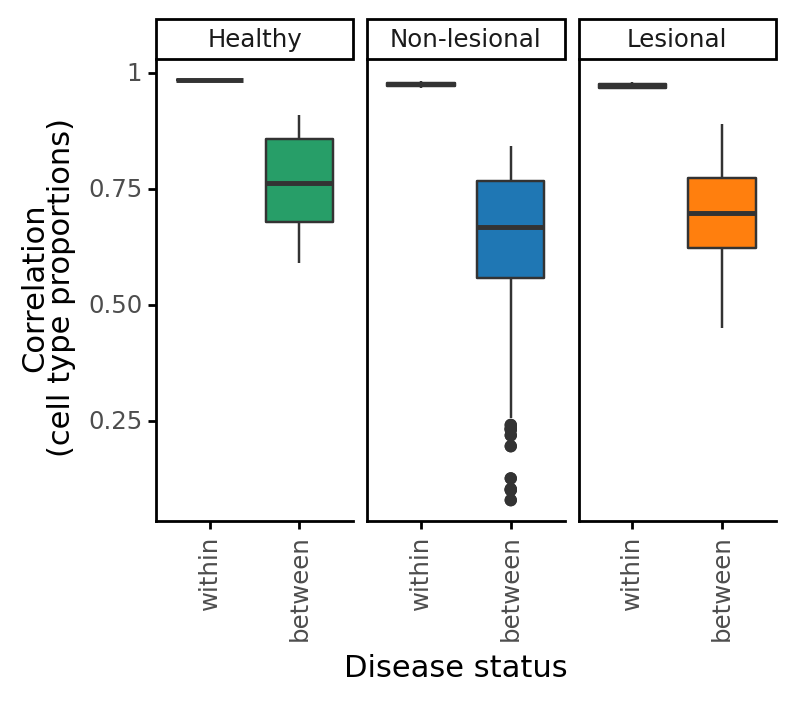

<ggplot: (8762108362487)>

In [273]:
g = (
    ggplot(aes(x='bw', y='corr'), data=cor_df) + 
    #geom_sina(alpha=0.3, color='grey') + 
    geom_boxplot(aes(fill='disease_lesional'), alpha=1, show_legend=False) + 
    #geom_point(alpha=0.1, color='grey') +     
    labs(x='Disease status', y='Correlation\n(cell type proportions)', color='Disease status') + 
    facet_wrap('disease_lesional', nrow=1) + 
    theme_classic() + 
    scale_fill_manual(values=adata.uns['disease_lesional_colors']) +
    theme(axis_text_x=element_text(angle=90), figure_size=(4,3))
)

ggsave(g, 'figures/figure01/proportion-individual-between-within-boxplot.pdf')
g

## Disease signatures

In [9]:
disease_signature = [
    'CCL1',
    'CCL17',
    'CCL18',
    'CCL20',
    'CCL22',
    'CCL26',
    'CCL4',
    'CCR1',
    'CCR5',
    'CCR7',
    'CD1B',
    'CD2',
    'CD28',
    'CD3D',
    'CD3E',
    'CD3G',
    'CD5',
    'CD80',
    'CD86',
    'CTLA4',
    'CXCL1',
    'CXCL10',
    'CXCL2',
    'CXCL3',
    'CXCL9',
    'CXCR4',
    'ICOS',
    'IL12RB2',
    'IL19',
    'IL22',
    'IL23A',
    'IL2RA',
    'IL32',
    'IL7R',
    'ITGAX',
    'ITGB2',
    'ITK',
    'JAK3',
    'LCK',
    'MMP12',
    'OASL',
    'PI3',
    'S100A12',
    'S100A9',
    'STAT1',
]

In [10]:
from scipy.stats import zscore

In [11]:
sc.tl.score_genes(adata, gene_list=disease_signature, n_bins=30, score_name='Disease score (MADAD Immune)')
#adata.obs['Disease score (MADAD Immune)'] = zscore(adata.obs['Disease score (MADAD Immune)'])

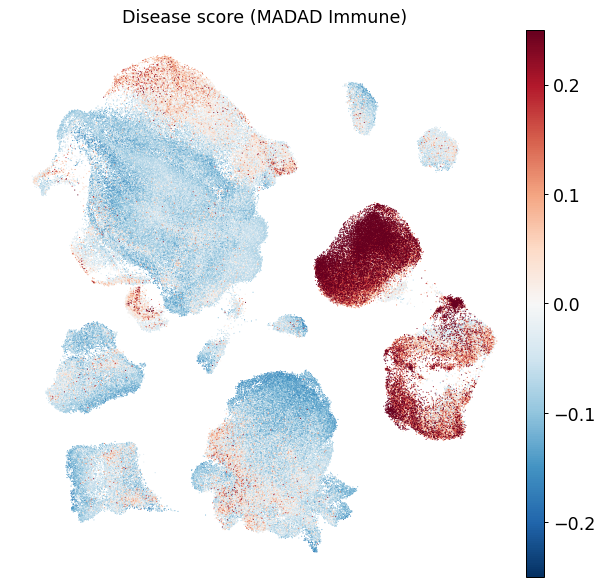

In [12]:
plt.rcParams['figure.figsize'] = (8,8)
sc.pl.umap(adata, color=['Disease score (MADAD Immune)'], frameon=False, cmap='RdBu_r', size=3, vmax=.25, vmin=-.25, save='madad-immune.pdf')
plt.rcParams['figure.figsize'] = (4,4)

In [13]:
disease_signature_full = [
 'ACAP1',
 'ACPP',
 'ADAM10',
 'ADAM19',
 'ADAM23',
 'ADAM8',
 'ADAMDEC1',
 'ADAP2',
 'AIM2',
 'AKR1B10',
 'AMD1',
 'ANGPTL4',
 'APELA',
 'APOBEC3A',
 'APOBEC3B',
 'AREG',
 'ARHGAP9',
 'ARNTL2',
 'ASF1B',
 'ASPM',
 'AURKA',
 'BATF3',
 'BCL2A1',
 'BIRC5',
 'BLM',
 'BUB1',
 'BUB1B',
 'C10orf99',
 'C12orf29',
 'C12orf5',
 'C12orf56',
 'C15orf48',
 'C17orf96',
 'C21orf91',
 'C5orf20',
 'C9orf84',
 'CA2',
 'CACNB4',
 'CASC5',
 'CCL13',
 'CCL17',
 'CCL18',
 'CCL19',
 'CCL2',
 'CCL22',
 'CCL26',
 'CCL5',
 'CCL8',
 'CCNA2',
 'CCNB1',
 'CCNB2',
 'CCNE1',
 'CCR7',
 'CD1B',
 'CD1E',
 'CD2',
 'CD274',
 'CD28',
 'CD3D',
 'CD48',
 'CD6',
 'CD69',
 'CDC20',
 'CDC45',
 'CDCA2',
 'CDCA3',
 'CDCA5',
 'CDH3',
 'CDK1',
 'CDK5R1',
 'CDKN3',
 'CDT1',
 'CEMIP',
 'CENPA',
 'CENPE',
 'CENPF',
 'CENPN',
 'CENPW',
 'CEP55',
 'CFB',
 'CH25H',
 'CHEK1',
 'CHI3L2',
 'CKAP2L',
 'CLEC10A',
 'CLEC7A',
 'CNFN',
 'COL4A4',
 'COL6A5',
 'COL6A6',
 'CORO1A',
 'CPEB2',
 'CST7',
 'CTLA4',
 'CTSC',
 'CXADR',
 'CXCL1',
 'CXCL10',
 'CXCL11',
 'CXCL2',
 'CXCL8',
 'CXorf65',
 'CYP27B1',
 'CYTIP',
 'DCAF8',
 'DCTN5',
 'DEFB103B',
 'DEFB4A',
 'DEPDC1B',
 'DIAPH3',
 'DLGAP5',
 'DNASE1L3',
 'DPP4',
 'DSC2',
 'DSG3',
 'DUOXA1',
 'E2F7',
 'ECT2',
 'ELL2',
 'EPSTI1',
 'F12',
 'FAIM3',
 'FAM111B',
 'FAM124B',
 'FAM26F',
 'FAM83A',
 'FAS',
 'FCHSD1',
 'FGFBP1',
 'FLVCR2',
 'FOSB',
 'FOSL1',
 'FOXM1',
 'FPR1',
 'FPR3',
 'FYB',
 'GALNT6',
 'GBP1',
 'GK',
 'GNA15',
 'GNLY',
 'GPR171',
 'GPR183',
 'GPR65',
 'GPRIN1',
 'GPSM3',
 'GTSE1',
 'GZMA',
 'GZMB',
 'HAL',
 'HAS3',
 'HBEGF',
 'HCK',
 'HERC6',
 'HJURP',
 'HMMR',
 'HPSE',
 'HS3ST3A1',
 'ICOS',
 'IFI27',
 'IFI44',
 'IGFL1',
 'IL12RB1',
 'IL12RB2',
 'IL13RA2',
 'IL18RAP',
 'IL23A',
 'IL27RA',
 'IL2RG',
 'IL36G',
 'IL36RN',
 'IL4R',
 'IL7R',
 'INA',
 'IQGAP3',
 'IRF1',
 'IRF7',
 'ISG15',
 'ISG20',
 'ITGAL',
 'ITGAX',
 'ITK',
 'IVL',
 'JAK3',
 'KCNJ15',
 'KIAA0101',
 'KIAA1644',
 'KIF14',
 'KIF18B',
 'KIF20A',
 'KIF2C',
 'KIF4A',
 'KLHDC7B',
 'KLK10',
 'KLK13',
 'KLK9',
 'KLRB1',
 'KLRK1',
 'KRT16',
 'KRT6A',
 'KRT6B',
 'KYNU',
 'LAMP3',
 'LCE3D',
 'LCK',
 'LCN2',
 'LCP2',
 'LGALS2',
 'LILRB2',
 'LINC01094',
 'LMNB2',
 'LOC100288860',
 'LRP8',
 'LTB',
 'LTF',
 'LYN',
 'MAP4K1',
 'MARCH1',
 'MCOLN2',
 'MELK',
 'MFHAS1',
 'MIAT',
 'MIR142',
 'MIR155HG',
 'MKI67',
 'MMP1',
 'MMP12',
 'MMP19',
 'MMP3',
 'MMP9',
 'MND1',
 'MNDA',
 'MOXD1',
 'MPZL2',
 'MS4A14',
 'MX1',
 'MXD1',
 'MYO1B',
 'NAPG',
 'NAPSB',
 'NCAPG',
 'NDC1',
 'NDC80',
 'NEIL3',
 'NETO2',
 'NOD2',
 'NR4A3',
 'NUF2',
 'NUP50',
 'NUSAP1',
 'OAS1',
 'OAS2',
 'OAS3',
 'OASL',
 'P2RY1',
 'P2RY2',
 'PARP9',
 'PARVG',
 'PBK',
 'PCDH7',
 'PDPN',
 'PGF',
 'PHF19',
 'PI15',
 'PI3',
 'PIK3CG',
 'PIK3R5',
 'PKP1',
 'PLAGL2',
 'PLAU',
 'PLAUR',
 'PLXDC1',
 'PML',
 'PNPT1',
 'POC1A',
 'POLQ',
 'POLR3G',
 'PPP2R2C',
 'PRDM1',
 'PRKCQ',
 'PRKCQ-AS1',
 'PRR11',
 'PRSS27',
 'PRSS53',
 'PTAFR',
 'PTPN7',
 'PTPRC',
 'PTX3',
 'RAB27A',
 'RAD51AP1',
 'RALGPS2',
 'RASGRP1',
 'RELB',
 'RGS1',
 'RGS20',
 'RIT1',
 'RNF144B',
 'RRM2',
 'RSAD2',
 'RTP4',
 'S100A7',
 'S100A7A',
 'S100A8',
 'S100A9',
 'SAMD9',
 'SAMD9L',
 'SAMSN1',
 'SASH3',
 'SCO2',
 'SELE',
 'SELL',
 'SELPLG',
 'SERPINA1',
 'SERPINB13',
 'SERPINB3',
 'SERPINB4',
 'SFT2D2',
 'SH2D5',
 'SH3PXD2A-AS1',
 'SH3TC1',
 'SLAMF1',
 'SLAMF7',
 'SLAMF8',
 'SLC26A9',
 'SLC28A3',
 'SLC2A1',
 'SLC5A1',
 'SLFN5',
 'SMC4',
 'SMOX',
 'SNHG3',
 'SNX20',
 'SOCS3',
 'SPC25',
 'SPRR1A',
 'SPRR1B',
 'SPRR2C',
 'SPRR2D',
 'SPRR3',
 'SPTLC2',
 'STAM2',
 'STAT1',
 'STK17B',
 'SYNCRIP',
 'TAGAP',
 'TBC1D10C',
 'TEX101',
 'TFEC',
 'TGM1',
 'TGM3',
 'THAP2',
 'THBD',
 'THBS1',
 'TIFAB',
 'TK1',
 'TMC5',
 'TMEM45B',
 'TMPRSS4',
 'TNC',
 'TNFRSF12A',
 'TOP2A',
 'TPX2',
 'TRAT1',
 'TRIP13',
 'TTC39A',
 'TTK',
 'TYMP',
 'UBA6',
 'UBD',
 'UBE2C',
 'UBE2T',
 'UBE3C',
 'UGT1A1',
 'UGT1A6',
 'UGT1A9',
 'VMP1',
 'VSNL1',
 'WNT5A',
 'WWTR1',
 'XAF1',
 'XCL1',
 'XCL2',
 'ZBED2',
 'ZBED6CL',
 'ZC3H12A',
 'ZC3H12D',
]

In [14]:
sc.tl.score_genes(adata, gene_list=disease_signature_full, n_bins=30, score_name='Disease score (MADAD Full)', use_raw=False)

In [15]:
adata.uns['disease_lesional_colors'] = ['#279e68', '#1f77b4', '#ff7f0e']

In [16]:
disease_signature_union = sorted(list(set(disease_signature_full) | set(disease_signature)))
disease_signature_union[:20]

['ACAP1',
 'ACPP',
 'ADAM10',
 'ADAM19',
 'ADAM23',
 'ADAM8',
 'ADAMDEC1',
 'ADAP2',
 'AIM2',
 'AKR1B10',
 'AMD1',
 'ANGPTL4',
 'APELA',
 'APOBEC3A',
 'APOBEC3B',
 'AREG',
 'ARHGAP9',
 'ARNTL2',
 'ASF1B',
 'ASPM']

In [17]:
sc.tl.score_genes(adata, gene_list=disease_signature_union, n_bins=30, score_name='Disease score (MADAD Union)', use_raw=False)
#adata.obs['Disease score (MADAD Union)'] = zscore(adata.obs['Disease score (MADAD Union)'])

In [18]:
adata.uns['disease_lesional_colors'] = ['#279e68', '#1f77b4', '#ff7f0e']

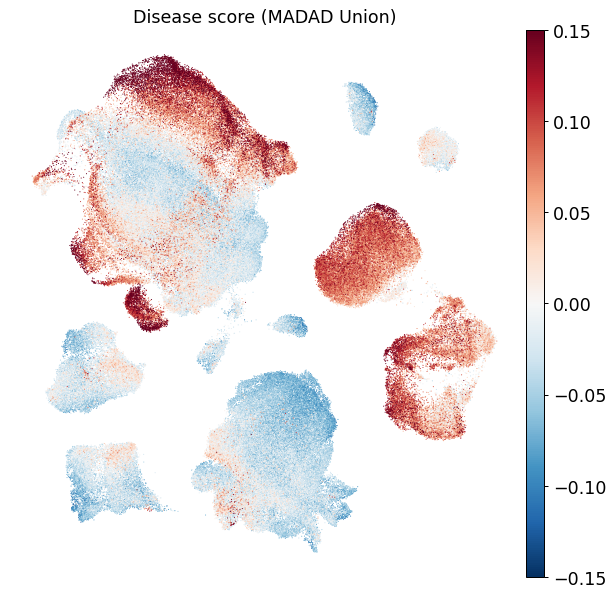

In [19]:
plt.rcParams['figure.figsize'] = (8,8)
sc.pl.umap(adata, color=['Disease score (MADAD Union)'], cmap='RdBu_r', size=3, vmax=.15, vmin=-.15, save='madad-union.pdf', frameon=False)
plt.rcParams['figure.figsize'] = (4,4)

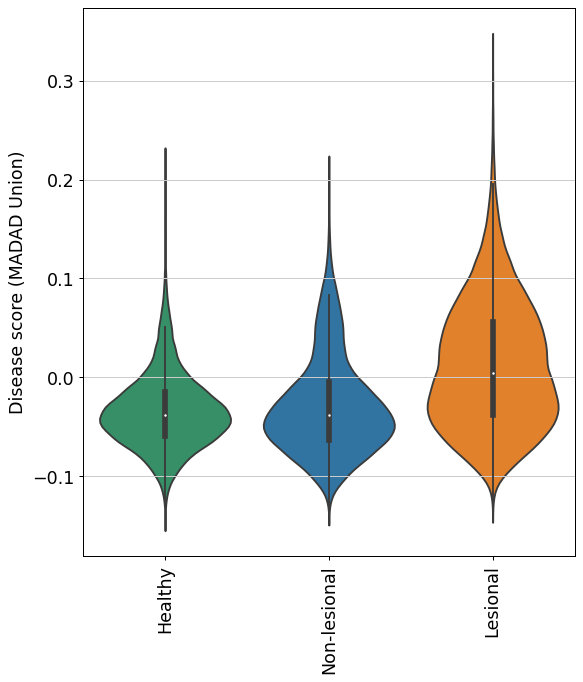

In [20]:
f, ax = plt.subplots(figsize=(7,8))
sc.pl.violin(adata, keys=['Disease score (MADAD Union)'], groupby='disease_lesional', rotation=90, wspace=0.7, stripplot=False, inner='box', hspace=0.2, ax=ax)
f.savefig('figures/madad-disease_lesional-violin.pdf')

In [22]:
adata.raw

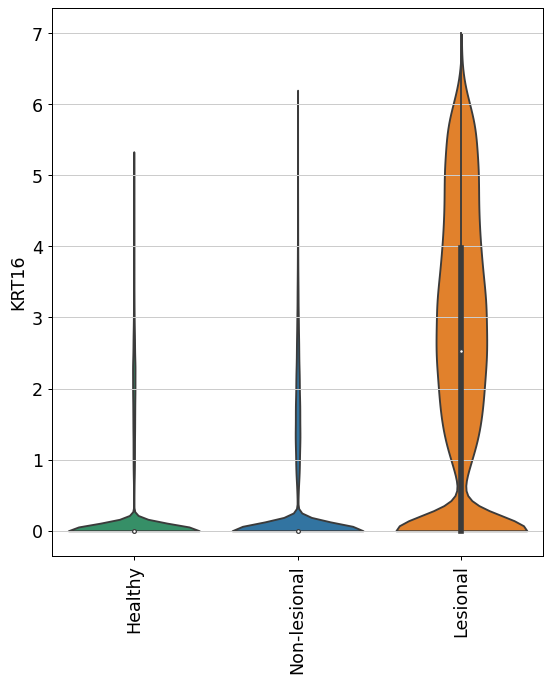

In [23]:
f, ax = plt.subplots(figsize=(7,8))
sc.pl.violin(adata[adata.obs['Cell type'] == 'Keratinocytes'], keys=['KRT16'], groupby='disease_lesional', stripplot=False, inner='box', rotation=90, wspace=0.7, hspace=0.2, ax=ax, use_raw=False)
f.savefig('figures/figure01/violin-disease_lesional-KC-KRT16.pdf')

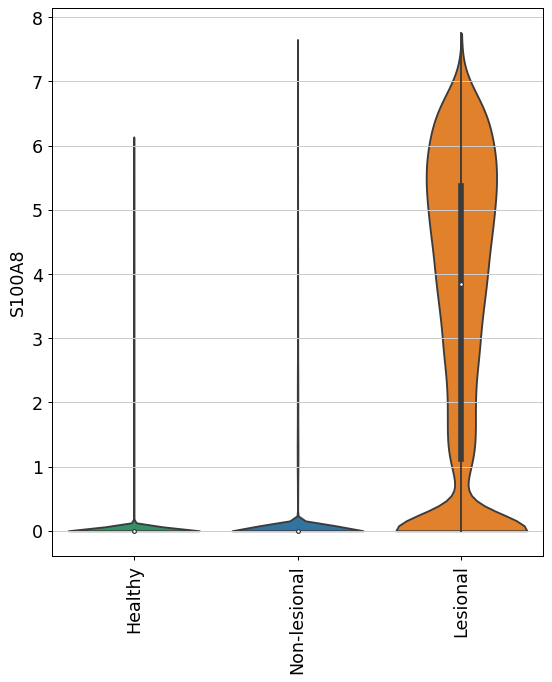

In [24]:
f, ax = plt.subplots(figsize=(7,8))
sc.pl.violin(adata[adata.obs['Cell type'] == 'Keratinocytes'], keys=['S100A8'], groupby='disease_lesional', stripplot=False, inner='box', rotation=90, wspace=0.7, hspace=0.2, ax=ax, use_raw=False)
f.savefig('figures/figure01/violin-disease_lesional-KC-S100A8.pdf')

In [ ]:
plt.rcParams['figure.figsize'] = (8,8)
sc.pl.umap(adata, color=['KRT16', 'S100A8'], cmap='RdBu_r', size=3, vmax=3, vmin=-3, save='-krt16-s100a8.pdf', layer='scaled')
plt.rcParams['figure.figsize'] = (4,4)

In [ ]:
plt.rcParams['figure.figsize'] = (8,8)
sc.pl.umap(adata, color=['Disease score (MADAD Union)', 'Disease score (MADAD Immune)', 'disease_lesional'], cmap='RdBu_r', size=3, vmax='p99')
plt.rcParams['figure.figsize'] = (4,4)

## t-test for MADAD scores

In [21]:
ad = adata
l = ad[ad.obs.disease_lesional == 'Lesional'].obs['Disease score (MADAD Union)'].values
nl = ad[ad.obs.disease_lesional == 'Non-lesional'].obs['Disease score (MADAD Union)'].values
h = ad[ad.obs.disease_lesional == 'Healthy'].obs['Disease score (MADAD Union)'].values

t_hl, p_hl = sp.stats.ttest_ind(l, h, equal_var=False)
t_hnl, p_hnl = sp.stats.ttest_ind(nl, h, equal_var=False)    

#print(ct)
#print('means:', l.mean(), h.mean())
#print('std:', l.std(), h.std(), '\n')

mean_hl = l.mean() - h.mean()
mean_hnl = nl.mean() - h.mean()

values = [p_hl, t_hl, p_hnl, t_hnl, mean_hl, mean_hnl]
keys = ['pval_hl', 'tstat_hl', 'pval_hnl', 'tstat_hnl', 'mean_hl', 'mean_hnl']

results = dict(zip(keys, values))
results

{'pval_hl': 0.0,
 'tstat_hl': 195.04521645489788,
 'pval_hnl': 1.8117193419709682e-152,
 'tstat_hnl': 26.332314481819502,
 'mean_hl': 0.046672948,
 'mean_hnl': 0.00579709}

In [ ]:
f, ax = plt.subplots(figsize=(12,3))
ad = adata[adata.obs['Cell type'] != 'Neutrophils']
sorted_celltype = ad.obs.groupby(ad.obs['Cell type'])[['Disease score (MADAD Union)']].median().sort_values('Disease score (MADAD Union)', ascending=False).index.values.astype(str)
sc.pl.violin(adata, keys=['Disease score (MADAD Union)'], groupby='Cell type', rotation=90, wspace=0.7, stripplot=False, inner='box', hspace='0.2', figsize=(10,3), ax=ax, order=sorted_celltype, save='madad-union-percelltype.pdf')

#f, ax = plt.subplots(figsize=(3,4))
#sc.pl.violin(adata, keys=['Disease score (MADAD Union)'], groupby='disease_lesional', rotation=90, wspace=0.7, stripplot=False, inner='box', hspace=0.2, ax=ax)

In [ ]:
f, ax = plt.subplots(figsize=(25,3))
ad = adata
sorted_celltype = ad.obs.groupby(ad.obs['Cell type granular'])[['Disease score (MADAD Union)']].median().sort_values('Disease score (MADAD Union)', ascending=False).index.values.astype(str)
sc.pl.violin(adata, keys=['Disease score (MADAD Union)'], groupby='Cell type granular', rotation=90, wspace=0.7, stripplot=False,
             inner='box', hspace='0.2', figsize=(10,3), ax=ax, order=sorted_celltype, save='madad-union-percelltypegranular.pdf')

#f, ax = plt.subplots(figsize=(3,4))
#sc.pl.violin(adata, keys=['Disease score (MADAD Union)'], groupby='disease_lesional', rotation=90, wspace=0.7, stripplot=False, inner='box', hspace=0.2, ax=ax)

In [ ]:
f, ax = plt.subplots(figsize=(12,3))
ad = adata[adata.obs['Cell type'].isin(['DC', 'Macrophages', 'Neutrophils', 'Mast', 'B cells', 'Plasma', 'T/NK'])]

sorted_celltype = ad.obs.groupby(ad.obs['Cell type granular'])[['Disease score (MADAD Immune)']].median().sort_values('Disease score (MADAD Immune)', ascending=False).index.values.astype(str)
sc.pl.violin(adata, keys=['Disease score (MADAD Immune)'], groupby='Cell type granular', rotation=90, wspace=0.7, stripplot=False,
             inner='box', hspace='0.2', figsize=(10,3), ax=ax, order=sorted_celltype, save='madad-union-percelltypegranular.pdf')

#f, ax = plt.subplots(figsize=(3,4))
#sc.pl.violin(adata, keys=['Disease score (MADAD Union)'], groupby='disease_lesional', rotation=90, wspace=0.7, stripplot=False, inner='box', hspace=0.2, ax=ax)

In [ ]:
f, axs = plt.subplots(3, 1, figsize=(12,14))
axs = axs.flatten()

for s,ax in zip(('Healthy', 'Non-lesional', 'Lesional'), axs):
    ad = adata[adata.obs['disease_lesional'] == s]
    sorted_celltype = ad.obs.groupby(ad.obs['Cell type'])[['Disease score (MADAD Union)']].median().sort_values('Disease score (MADAD Union)', ascending=False).index.values.astype(str).tolist()
    sorted_celltype.pop(sorted_celltype.index('Neutrophils'))
    sc.pl.violin(ad, keys='Disease score (MADAD Union)', groupby='Cell type', rotation=90, 
                 wspace=0.7, stripplot=False, inner='box', hspace='0.2', figsize=(10,3), ax=ax, order=sorted_celltype, show=False)
    ax.set_title(s)
    
plt.subplots_adjust(hspace=1.7)
plt.savefig('figures/disease_score_per_celltype.pdf')

## Top 20 genes contributing to MADAD scores per cell type

In [22]:
adata.obs['Cell type'].cat.categories

Index(['Keratinocytes', 'Cornified keratinocytes', 'Sweat gland',
       'Fibroblasts', 'Pericyte/SMC', 'VEC', 'LEC', 'Melanocytes', 'Schwann',
       'DC', 'Macrophages', 'Neutrophils', 'Mast', 'B cells', 'Plasma',
       'T/NK'],
      dtype='object')

In [23]:
inflammation_celltypes = [
    #'B cells',
    'Cornified keratinocytes', 
    'Keratinocytes',
    'DC', 
    'Macrophages', 
    'T/NK',    
    'Fibroblasts',
    'Pericyte/SMC',
    #'LEC',
    #'Mast',
    #'Melanocytes',
    #'Neutrophils',
    #'Plasma',
    #'Schwann',
    #'Sweat gland',
    #'VEC',
]

In [ ]:
top = 20
zscore_cutoff = 0.5
disease_sig_intersect = sorted(list(set(adata.var_names) & set(disease_signature_union)))
ad_madad = adata[:, disease_sig_intersect].copy()
sc.pp.scale(ad_madad)
top_madad_genes = {}

for ct in adata.obs['Cell type'].cat.categories:
    ad_madad_ct = ad_madad[(ad_madad.obs['Cell type'] == ct) & (ad_madad.obs.disease_lesional == 'Lesional')].copy()
    means = np.mean(ad_madad_ct.X, axis=0)
    df = pd.DataFrame(dict(gene=ad_madad_ct.var_names.values, 
                           mean=means)).sort_values('mean', ascending=False)
    df = df[df['mean']>zscore_cutoff][:top]
    #df = df[:top]

    if len(df) == 0:
        continue
        
    ct_top_genes = df.gene.values
    top_madad_genes[ct] = ct_top_genes
    
    print(ct)
    #sc.pl.matrixplot(ad_madad[ad_madad.obs.disease_lesional == 'Lesional'], ct_top_genes, groupby='Cell type', cmap='Blues', use_raw=False, standard_scale='var')

In [ ]:
inflammation_celltypes

In [68]:
celltype_order = [
 'Cornified keratinocytes',
 'Keratinocytes',

 'DC',
 'Macrophages',
 'T/NK',    
 'B cells',
 'Mast',    
 'Neutrophils',
 'Plasma',
    
 'Fibroblasts',
 'Pericyte/SMC',
 'Schwann',

 'LEC',
 'VEC',    
    
 'Melanocytes',
 'Sweat gland',

]

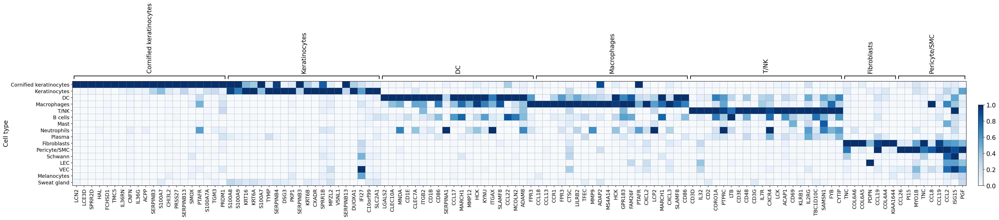

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[37.12, 0, 0.2])

In [60]:
ad_madad.obs['Cell type'] = pd.Categorical(ad_madad.obs['Cell type'], categories=celltype_order)

sc.pl.matrixplot(ad_madad[ad_madad.obs.disease_lesional == 'Lesional'],
                 var_names={k:top_madad_genes[k] for k in inflammation_celltypes},
                 groupby='Cell type', 
                 cmap='Blues', 
                 use_raw=False, 
                 standard_scale='var',
                 save='madad-enriched-genes-per-celltype.pdf')

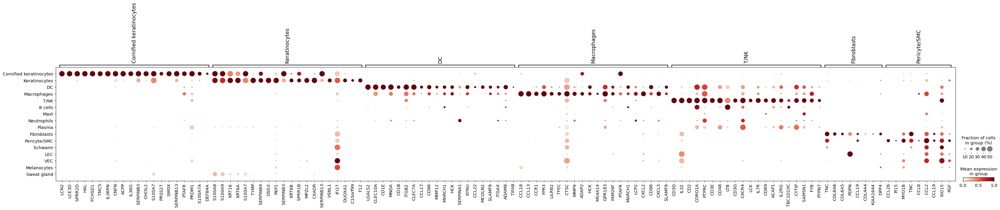

In [74]:
ad = adata.copy()
ad.obs['Cell type'] = pd.Categorical(ad.obs['Cell type'], categories=celltype_order)

sc.pl.dotplot(ad[ad.obs.disease_lesional == 'Lesional'],
              var_names={k:top_madad_genes[k] for k in inflammation_celltypes},
              groupby='Cell type', 
              use_raw=False, 
              standard_scale='var', dot_max=0.5, dot_min=.05,
              save='madad-enriched-genes-per-celltype.pdf')

## Violins of top 5 genes contributing to MADAD scores per cell type

In [ ]:
top_madad_genes

for ct in inflammation_celltypes:
    print(ct)
    ad = adata[(adata.obs['Cell type'] == ct)]
    sc.pl.violin(ad, keys=top_madad_genes[ct].tolist(), groupby='disease_lesional', rotation=90, stripplot=False, inner='box')

## Per-cell type MADAD Full score

In [26]:
rows = []

for ct in adata.obs['Cell type'].cat.categories:
    if ct == 'Neutrophils':
        continue
        
    ad = adata[adata.obs['Cell type'] == ct]

    l = ad[ad.obs.disease_lesional == 'Lesional'].obs['Disease score (MADAD Union)'].values
    nl = ad[ad.obs.disease_lesional == 'Non-lesional'].obs['Disease score (MADAD Union)'].values
    h = ad[ad.obs.disease_lesional == 'Healthy'].obs['Disease score (MADAD Union)'].values

    t_hl, p_hl = sp.stats.ttest_ind(l, h, equal_var=False)
    t_hnl, p_hnl = sp.stats.ttest_ind(nl, h, equal_var=False)    
    
    #print(ct)
    #print('means:', l.mean(), h.mean())
    #print('std:', l.std(), h.std(), '\n')

    mean_hl = l.mean() - h.mean()
    mean_hnl = nl.mean() - h.mean()

    rows.append([ct, p_hl, t_hl, p_hnl, t_hnl, mean_hl, mean_hnl])

<ipython-input-26-07d4cd069c56>:20: RuntimeWarning: Mean of empty slice.
/home/gokcen/.miniconda3/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
<ipython-input-26-07d4cd069c56>:21: RuntimeWarning: Mean of empty slice.


In [27]:
pt = pd.DataFrame(rows, columns = ['celltype', 'pval_hl', 'tstat_hl', 'pval_hnl', 'tstat_hnl', 'mean_hl', 'mean_hnl']).sort_values('mean_hl', ascending=False).reset_index(drop=True)

s_hl, pvaladj_hl, _, _ = multipletests(pt.pval_hl, alpha=0.1, method='fdr_bh')
s_hnl, pvaladj_hnl, _, _ = multipletests(pt.pval_hnl, alpha=0.1, method='fdr_bh')

pt['pval_hl_adj'] = pvaladj_hl
pt['pval_hnl_adj'] = pvaladj_hnl
pt['significant_hl'] = s_hl
pt['significant_hnl'] = s_hnl

pt

,celltype,pval_hl,tstat_hl,pval_hnl,tstat_hnl,mean_hl,mean_hnl,pval_hl_adj,pval_hnl_adj,significant_hl,significant_hnl
0,Cornified keratinocytes,5.019090e-61,25.678490,7.761769e-62,19.310819,0.123559,0.040761,NaN,NaN,True,True
1,Keratinocytes,0.000000e+00,228.030790,6.328424e-02,1.857222,0.072366,0.000450,NaN,NaN,True,True
2,T/NK,0.000000e+00,47.712004,9.036908e-174,28.856805,0.026030,0.015895,NaN,NaN,True,True
3,Macrophages,3.754509e-64,17.528619,5.181214e-54,15.913085,0.024435,0.022657,NaN,NaN,True,True
4,Sweat gland,1.305455e-06,5.090938,5.757437e-02,1.904464,0.022606,0.005277,NaN,NaN,True,True
5,DC,2.940392e-63,17.806487,1.404941e-132,26.827908,0.022465,0.037174,NaN,NaN,True,True
6,LEC,1.173348e-31,11.858570,8.094829e-02,1.745927,0.012737,0.001964,NaN,NaN,True,False
7,Fibroblasts,2.409939e-172,28.162445,2.440977e-69,-17.648348,0.008306,-0.004990,NaN,NaN,True,True
8,Mast,6.783152e-09,5.843550,2.109481e-12,7.122417,0.006312,0.007410,NaN,NaN,True,True
9,Plasma,1.774813e-01,1.367147,5.130516e-01,0.659734,0.005390,0.002460,NaN,NaN,False,False


In [28]:
pt = pd.DataFrame(rows, columns = ['celltype', 'pval_hl', 'tstat_hl', 'pval_hnl', 'tstat_hnl', 'mean_hl', 'mean_hnl']).sort_values('mean_hl', ascending=False).reset_index(drop=True)

s_hl, pvaladj_hl, _, _ = multipletests(pt.pval_hl, alpha=0.1, method='fdr_bh')
s_hnl, pvaladj_hnl, _, _ = multipletests(pt.pval_hnl, alpha=0.1, method='fdr_bh')

pt['pval_hl_adj'] = pvaladj_hl
pt['pval_hnl_adj'] = pvaladj_hnl
pt['significant_hl'] = s_hl
pt['significant_hnl'] = s_hnl

pt

,celltype,pval_hl,tstat_hl,pval_hnl,tstat_hnl,mean_hl,mean_hnl,pval_hl_adj,pval_hnl_adj,significant_hl,significant_hnl
0,Cornified keratinocytes,5.019090e-61,25.678490,7.761769e-62,19.310819,0.123559,0.040761,NaN,NaN,True,True
1,Keratinocytes,0.000000e+00,228.030790,6.328424e-02,1.857222,0.072366,0.000450,NaN,NaN,True,True
2,T/NK,0.000000e+00,47.712004,9.036908e-174,28.856805,0.026030,0.015895,NaN,NaN,True,True
3,Macrophages,3.754509e-64,17.528619,5.181214e-54,15.913085,0.024435,0.022657,NaN,NaN,True,True
4,Sweat gland,1.305455e-06,5.090938,5.757437e-02,1.904464,0.022606,0.005277,NaN,NaN,True,True
5,DC,2.940392e-63,17.806487,1.404941e-132,26.827908,0.022465,0.037174,NaN,NaN,True,True
6,LEC,1.173348e-31,11.858570,8.094829e-02,1.745927,0.012737,0.001964,NaN,NaN,True,False
7,Fibroblasts,2.409939e-172,28.162445,2.440977e-69,-17.648348,0.008306,-0.004990,NaN,NaN,True,True
8,Mast,6.783152e-09,5.843550,2.109481e-12,7.122417,0.006312,0.007410,NaN,NaN,True,True
9,Plasma,1.774813e-01,1.367147,5.130516e-01,0.659734,0.005390,0.002460,NaN,NaN,False,False


sorted_celltype_manual = ['Cornified keratinocytes', 'Keratinocytes', 'DC', 'Macrophages', 'T/NK', 'B cells', 'Plasma', 'Fibroblasts',
                          'LEC', 'Mast', 'Melanocytes', 'Schwann', 'Sweat gland', 'VEC', 'Pericyte/SMC', 'Neutrophils']
sorted_celltype_manual

In [29]:
sorted_celltype = pt.celltype.values.tolist()
sorted_celltype

['Cornified keratinocytes',
 'Keratinocytes',
 'T/NK',
 'Macrophages',
 'Sweat gland',
 'DC',
 'LEC',
 'Fibroblasts',
 'Mast',
 'Plasma',
 'Schwann',
 'VEC',
 'Melanocytes',
 'Pericyte/SMC',
 'B cells']

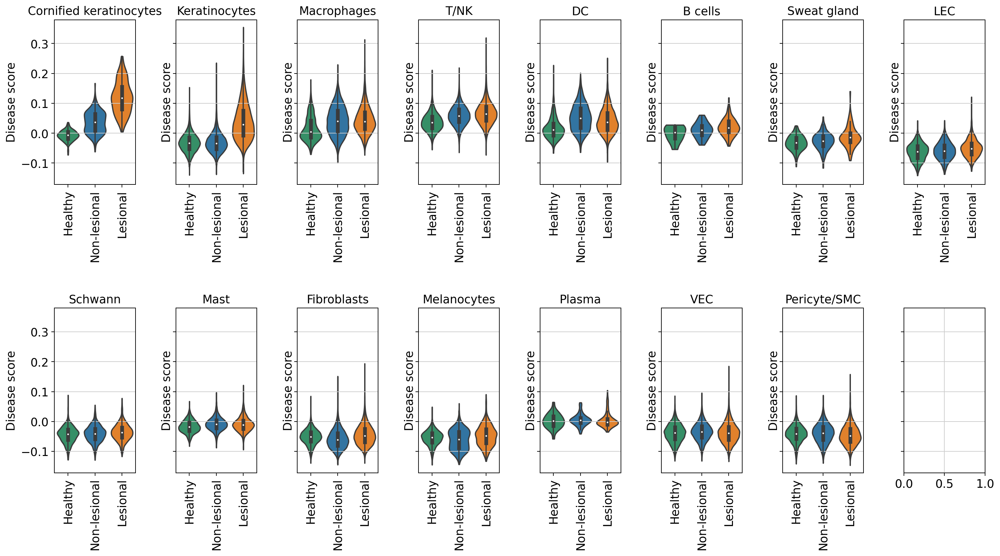

In [47]:
f, axs = plt.subplots(2, 8, figsize=(20,10), sharey=True)
axs = axs.flatten().ravel()

#sorted_celltype = adata.obs.groupby(adata.obs['Cell type'])[['Disease score (MADAD Full)']].median().sort_values('Disease score (MADAD Full)', ascending=False).index.values.astype(str)

for ct, ax in zip(sorted_celltype, axs):
    ad = adata[adata.obs['Cell type'] == ct].copy()
    sc.pl.violin(ad, keys=['Disease score (MADAD Union)'], groupby='disease_lesional', 
                 rotation=90, stripplot=False, inner='box', ax=ax, show=False, scale='width')
    ax.set_title(ct)
    ax.set_ylabel('Disease score')
    
plt.subplots_adjust(wspace=0.5, hspace=0.75)
f.savefig('figures/disease_score_per_celltype_diseasestatus.pdf')

## Pairwise disease score MADAD violins

In [ ]:
f, axs = plt.subplots(2, 5, figsize=(15,10), sharey=True)
axs = axs.flatten().ravel()

ind_list = [x for x in adata.obs.ind_id.cat.categories if (not x.startswith('Healthy')) and (x != 'MGH105')]

for ind, ax in zip(ind_list, axs):        
    ad = adata[adata.obs.ind_id == ind].copy()
    sc.pl.violin(ad, keys=['Disease score (MADAD Union)'], groupby='disease_lesional', 
                 rotation=90, stripplot=False, inner='box', ax=ax, show=False, scale='width')
    ax.set_title(ind)
    ax.set_ylabel('Disease score')
    
plt.subplots_adjust(wspace=0.5, hspace=0.75)
f.savefig('figures/disease_score_per_ind_id_diseasestatus.pdf')

In [65]:
sorted_celltype

['Cornified keratinocytes',
 'Keratinocytes',
 'Macrophages',
 'T/NK',
 'DC',
 'B cells',
 'Sweat gland',
 'LEC',
 'Schwann',
 'Mast',
 'Fibroblasts',
 'Melanocytes',
 'Plasma',
 'VEC',
 'Pericyte/SMC']

In [66]:
df = adata.obs[['Disease score (MADAD Union)', 'Cell type', 'disease_lesional']].reset_index(drop=True).copy()
df['Cell type'] = pd.Categorical(df['Cell type'], categories=sorted_celltype + ['Neutrophils'])
df['score'] = df['Disease score (MADAD Union)']

In [67]:
df['Cell type'].value_counts()

Keratinocytes              122762
Fibroblasts                 77214
T/NK                        33118
VEC                         17584
Pericyte/SMC                15395
DC                          15009
Macrophages                 11018
Mast                         5043
LEC                          4870
Melanocytes                  4218
Schwann                      2362
Cornified keratinocytes       795
Sweat gland                   483
Plasma                        282
B cells                       152
Neutrophils                    74
Name: Cell type, dtype: int64

In [ ]:
(
    ggplot(data=df, mapping=aes(x='disease_lesional', y='score', group='disease_lesional')) + 
    geom_jitter(size=0.1, width=0.1, alpha=0.2) + 
    geom_violin(aes(fill='disease_lesional'), alpha=0.6, scale='width') + 
    scale_fill_manual(values=['#4F9B6C', '#3C75AF', '#EF8636']) + 
    stat_summary(geom="point", fill='white', color="black", fun_y=np.mean) +
    facet_wrap('Cell type', ncol=8, scales='free_x') + 
    theme_bw() + 
    labs(x='Disease status', y='Disease score (MADAD Union)', fill='Disease status') +
    theme(figure_size=(15,10), 
          axis_text_x=element_text(rotation=45, hjust=1.0), 
          panel_spacing_y=0.9, panel_spacing_x=0.3)
)

## Rank channels by disease score

In [36]:
disease_key = 'Disease score (MADAD Union)'

violin_order = adata.obs[[disease_key, 'channel']].groupby('channel').median().sort_values(disease_key).index.values.tolist()

dl_colors = {
    'Healthy': '#279e68',
    'Non-lesional': '#1f77b4',
    'Lesional': '#ff7f0e',
}

channel2dl = adata.obs[['channel', 'disease_lesional']].drop_duplicates().set_index('channel').to_dict()['disease_lesional']

adata.uns['channel_colors'] = [dl_colors[channel2dl[x]] for x in adata.obs.channel.cat.categories]

## Keratinocyte lesional genes per channel violins (S100A8 and KRT16)

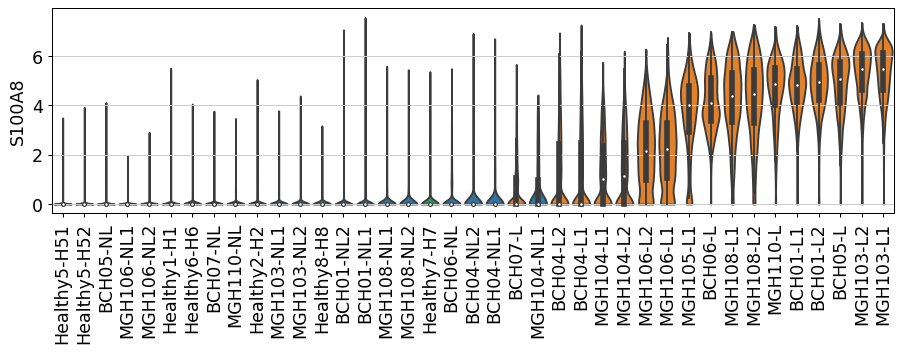

In [37]:
ad = adata[adata.obs['Cell type'] == 'Keratinocytes']

channel_order_s100a8 = pd.DataFrame(ad.obs_vector('S100A8'), 
                                    columns=['S100A8'],
                                    index=ad.obs.index).groupby(ad.obs.channel).mean().sort_values('S100A8').index.values.tolist()

f, ax = plt.subplots(figsize=(12,3))
sc.pl.violin(ad, keys='S100A8', groupby='channel', rotation=90, ax=ax, show=False, stripplot=False, inner='box', 
             order=channel_order_s100a8, save='disease_score_per_channel_S100A8.pdf')
f

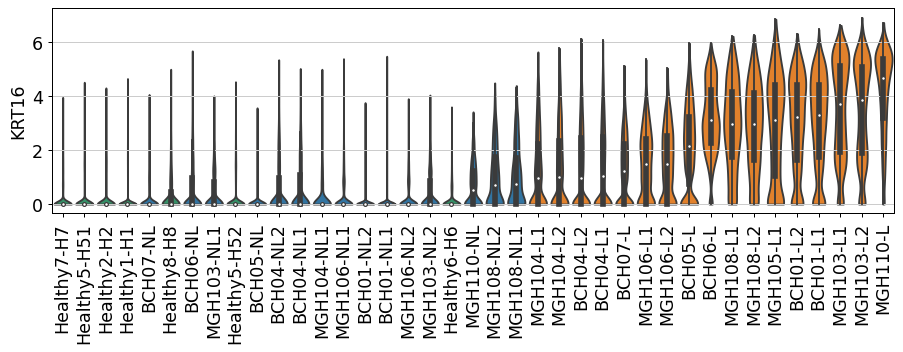

In [38]:
ad = adata[adata.obs['Cell type'] == 'Keratinocytes']

channel_order_krt16 = pd.DataFrame(ad.obs_vector('KRT16'), 
                                    columns=['KRT16'],
                                    index=ad.obs.index).groupby(ad.obs.channel).median().sort_values('KRT16').index.values.tolist()

f, ax = plt.subplots(figsize=(12,3))
sc.pl.violin(ad, keys='KRT16', groupby='channel', rotation=90, ax=ax, show=False, stripplot=False, inner='box', 
             order=channel_order_krt16, save='disease_score_per_channel_KRT16.pdf')
f

In [39]:
adata.obs['Cell type granular'].cat.categories

Index(['Keratinocyte 1', 'Proliferating keratinocytes', 'Keratinocyte 2',
       'Keratinocyte 3', 'Keratinocyte 4', 'Keratinocyte 5',
       'Cornified keratinocytes 1', 'Cornified keratinocytes 2',
       'Hair follicle 1', 'Hair follicle 2', 'Hair follicle 3',
       'Sebaceous gland', 'Sweat gland', 'Fibroblast COL23A1+NKD2+',
       'Fibroblast CCL19+TNC hi', 'Fibroblast CCL19+',
       'Fibroblast IGF1+APOD hi', 'Fibroblast TIMP1 hi',
       'Fibroblast PTN hi CPE hi', 'Fibroblast C2orf40+CDH19+',
       'Fibroblast C2orf40+NGFR+', 'Fibroblast SLPI+', 'Fibroblast DPEP1+',
       'Fibroblast COCH+', 'Pericyte RGS5 lo', 'Pericyte RGS5 hi',
       'Pericyte/SMC MYH11-', 'SMC PLN', 'Myocytes', 'Arterial EC IGFBP3+',
       'Arterial EC IGFBP3+IL6+', 'Capillary EC FABP4 hi',
       'Capillary EC EDNRB hi', 'EC EDNRB hi MCAM hi', 'Venule EC IL6+',
       'Venule EC ACKR1 lo SELE lo', 'Venule EC ACKR1 hi',
       'Arterial EC RGS5+ IGFBP3+', 'Capillary EC RGS5+ FABP4 hi',
       'Capill

View of AnnData object with n_obs × n_vars = 26526 × 29991
    obs: '10x_cell_calling', 'G2M_score', 'S_score', 'barcode_rank', 'chemistry_10x', 'disease_status', 'empty_drops_FDR', 'ind_id', 'lesional', 'log10_n_genes', 'log10_n_umis', 'mito_cutoff_', 'mt_frac', 'n_counts', 'n_genes', 'n_umis', 'neg_log10_empty_drops_FDR', 'phase', 'predicted_cell_types', 'predicted_sex', 'raw', 'sample_name', 'scrublet', 'scrublet_score', 'sex', 'disease_lesional', 'batch', 'leiden', 'Cell type', 'Cell type granular', 'ind_sample', 'channel', 'barcode', 'subject_id', 'global_disease_assessment', 'ad_family_history', 'sex_clinical', 'childbearing_potential', 'ethnicity_race', 'smoking', 'asthma', 'other_condition', 'systemic_corticosteroids', 'topical_corticosteroids', 'dupilumab', 'dupilumab_indication', 'dupilumab_other_indication', 'location', 'side', 'Disease score (MADAD Immune)', 'Disease score (MADAD Full)', 'Disease score (MADAD Union)', 'Cell type new cornified', 'ind_disease_lesional'
    va

<AxesSubplot:ylabel='IL13'>

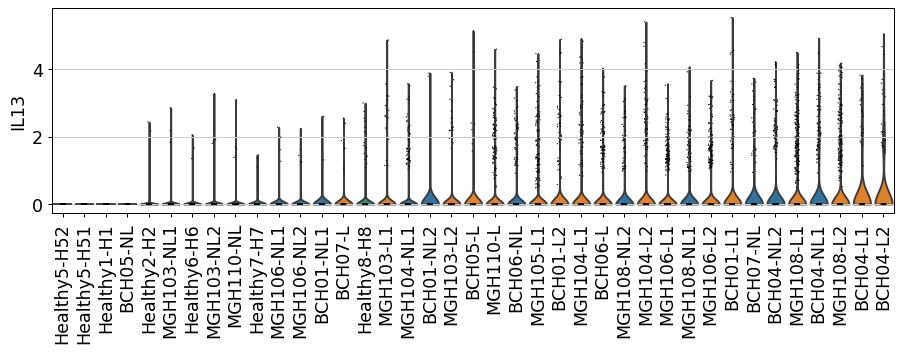

In [40]:
ad = adata[adata.obs['Cell type'] == 'T/NK']
print(ad)

channel_order_il13 = pd.DataFrame(ad.obs_vector('IL13'), 
                                    columns=['IL13'],
                                    index=ad.obs.index).groupby(ad.obs.channel).mean().sort_values('IL13').index.values.tolist()

f, ax = plt.subplots(figsize=(12,3))
sc.pl.violin(ad, keys='IL13', groupby='channel', rotation=90, ax=ax, show=False, stripplot=True, #inner='box', 
             order=channel_order_il13,
             #save='disease_score_per_channel_S100A8.pdf')
            )
#f

View of AnnData object with n_obs × n_vars = 17347 × 29991
    obs: '10x_cell_calling', 'G2M_score', 'S_score', 'barcode_rank', 'chemistry_10x', 'disease_status', 'empty_drops_FDR', 'ind_id', 'lesional', 'log10_n_genes', 'log10_n_umis', 'mito_cutoff_', 'mt_frac', 'n_counts', 'n_genes', 'n_umis', 'neg_log10_empty_drops_FDR', 'phase', 'predicted_cell_types', 'predicted_sex', 'raw', 'sample_name', 'scrublet', 'scrublet_score', 'sex', 'disease_lesional', 'batch', 'leiden', 'Cell type', 'Cell type granular', 'ind_sample', 'channel', 'barcode', 'subject_id', 'global_disease_assessment', 'ad_family_history', 'sex_clinical', 'childbearing_potential', 'ethnicity_race', 'smoking', 'asthma', 'other_condition', 'systemic_corticosteroids', 'topical_corticosteroids', 'dupilumab', 'dupilumab_indication', 'dupilumab_other_indication', 'location', 'side', 'Disease score (MADAD Immune)', 'Disease score (MADAD Full)', 'Disease score (MADAD Union)', 'Cell type new cornified', 'ind_disease_lesional'
    va

<AxesSubplot:ylabel='CCL17'>

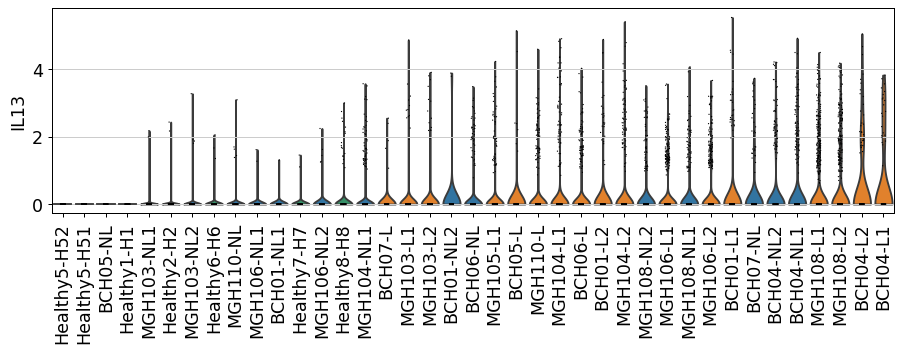

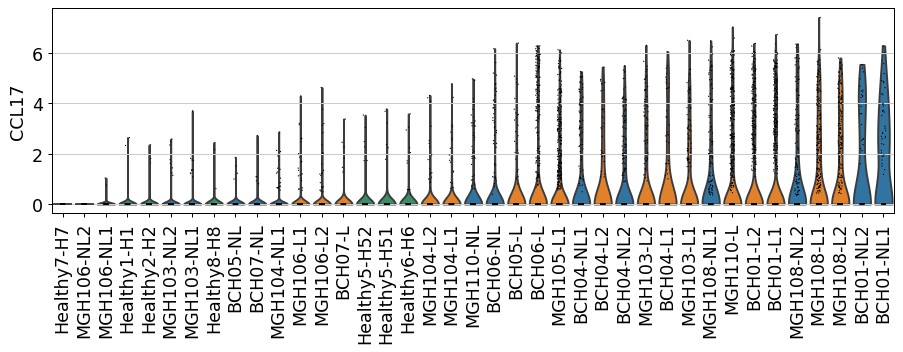

In [41]:
ad = adata[adata.obs['Cell type granular'].isin(['T cells CREM hi', 'T cells CREM lo FOS lo', 'T cells FOS hi',])]
print(ad)

channel_order_il13 = pd.DataFrame(ad.obs_vector('IL13'), 
                                    columns=['IL13'],
                                    index=ad.obs.index).groupby(ad.obs.channel).mean().sort_values('IL13').index.values.tolist()

f, ax = plt.subplots(figsize=(12,3))
sc.pl.violin(ad, keys='IL13', groupby='channel', rotation=90, ax=ax, show=False, stripplot=True, #inner='box', 
             order=channel_order_il13)


ad = adata[adata.obs['Cell type'].isin(['DC'])]
print(ad)

channel_order_ccl17 = pd.DataFrame(ad.obs_vector('CCL17'), 
                                    columns=['CCL17'],
                                    index=ad.obs.index).groupby(ad.obs.channel).mean().sort_values('CCL17').index.values.tolist()

f, ax = plt.subplots(figsize=(12,3))
sc.pl.violin(ad, keys='CCL17', groupby='channel', rotation=90, ax=ax, show=False, stripplot=True, #inner='box', 
             order=channel_order_ccl17)

## Overall MADAD score per channel

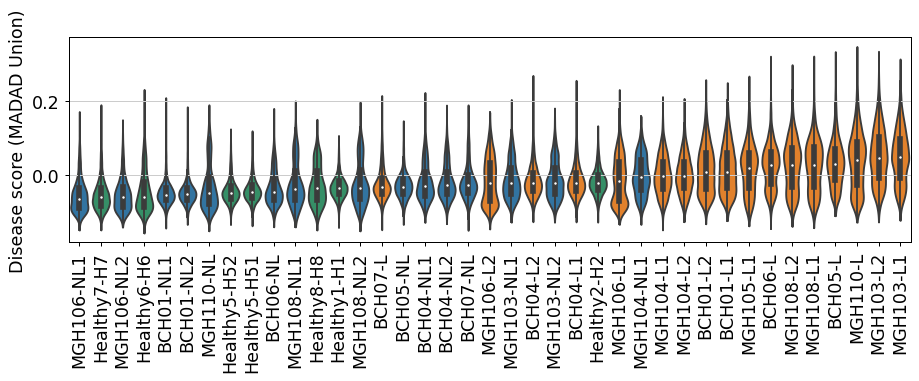

In [42]:
f, ax = plt.subplots(figsize=(12,3))
sc.pl.violin(adata, keys=disease_key, groupby='channel', rotation=90, ax=ax, 
             show=False, stripplot=False, inner='box', order=violin_order, 
             save='disease_score_per_channel_coloredbydiseasestatus.pdf')
f

In [43]:
sc.settings.figdir

PosixPath('figures/figure01')

In [173]:
adata.obs.global_disease_assessment.cat.categories

Index(['0 - Clear', '1 - Almost clear', '2 - Mild', '3 - Moderate',
       '4 - Severe'],
      dtype='object')

In [ ]:
sc.pl.umap(adata, color='global_disease_assessment')

In [174]:
adata.uns['global_disease_assessment_colors'] = ['#feebe2','#fbb4b9','#f768a1','#c51b8a','#7a0177']

In [ ]:
disease_assess_df = adata.obs[['channel', 'global_disease_assessment', 'disease_lesional']].drop_duplicates().set_index('channel')
#disease_assess_df.global_disease_assessment = disease_assess_df.global_disease_assessment.astype(str)
disease_assess_df.loc[disease_assess_df.disease_lesional == 'Non-lesional', 'global_disease_assessment'] = '0 - Clear'
disease_assess_df

In [191]:
disease_key = 'Disease score (MADAD Union)'

violin_order = adata.obs[[disease_key, 'channel']].groupby('channel').median().sort_values(disease_key).index.values.tolist()

dl_colors = {
    '0 - Clear': '#feebe2',
    '1 - Almost clear': '#fbb4b9', 
    '2 - Mild': '#f768a1',
    '3 - Moderate': '#c51b8a',
    '4 - Severe': '#7a0177',
}

channel2dl = disease_assess_df.to_dict()['global_disease_assessment']

adata.uns['channel_colors'] = [dl_colors[channel2dl[x]] for x in adata.obs.channel.cat.categories]

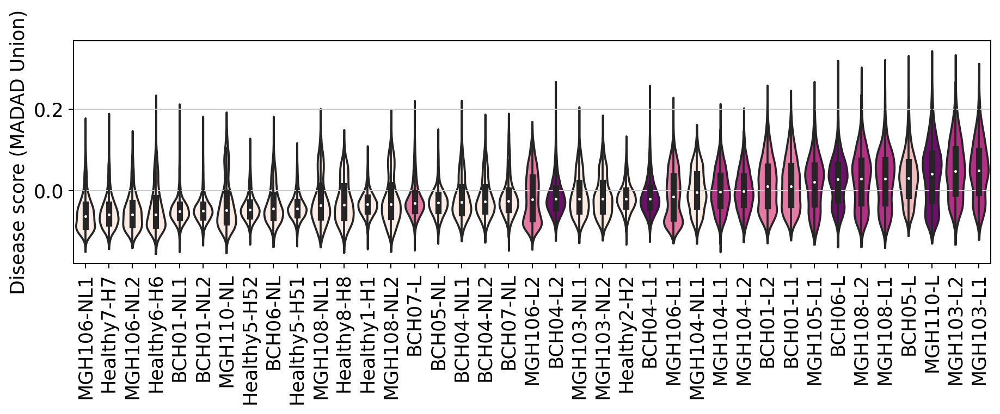

In [192]:
f, ax = plt.subplots(figsize=(12,3))
sc.pl.violin(adata, keys=disease_key, groupby='channel', rotation=90, ax=ax, 
             show=False, stripplot=False, inner='box', order=violin_order, 
             save='disease_score_per_channel_coloredbydiseasestatus.pdf')
f

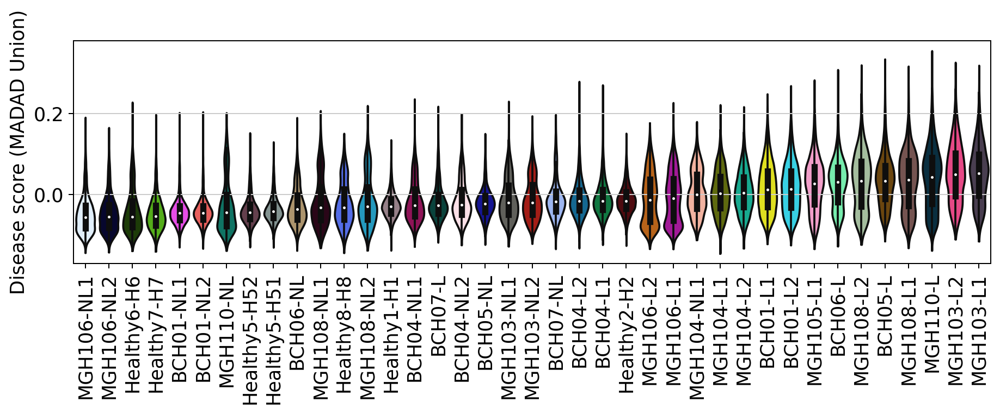

In [234]:
del adata.uns['channel_colors']

f, ax = plt.subplots(figsize=(12,3))
sc.pl.violin(adata, keys=disease_key, groupby='channel', rotation=90, ax=ax, 
             show=False, stripplot=False, inner='box', order=violin_order, 
             save='disease_score_per_channel.pdf')
f

## Rank channels by disease score per island

In [ ]:
n_cat = len(adata.obs['Cell type'].cat.categories)
f, axs = plt.subplots(n_cat, 1, figsize=(12,70))
axs = axs.flatten()

for ct, ax in zip(adata.obs['Cell type'].cat.categories, axs):
    ad = adata[adata.obs['Cell type'] == ct]
    violin_order = ad.obs[[disease_key, 'channel']].groupby('channel').median().sort_values(disease_key).index.values.tolist()
    sc.pl.violin(ad, keys=disease_key, groupby='channel', rotation=90, ax=ax, 
                 show=False, stripplot=False, inner='box', order=violin_order)
    #ax.set_ylabel(ct)
    ax.set_title(ct)
    
plt.subplots_adjust(hspace=1.4)
f.savefig('figures/disease_score_per_channel_per_celltype.pdf')

## EDC IL genes for cornified KERA

In [7]:
il_genes = 'IL1A, IL37, IL36G, IL36B, IL36RN, IL1F10, IL18, IL1R2, GSDMA'.split(', ')

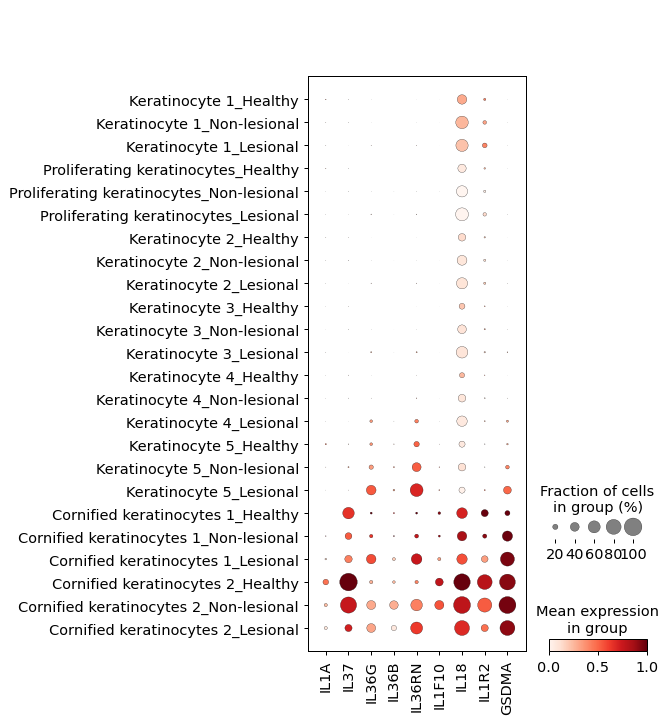

In [33]:
sc.pl.dotplot(adata[adata.obs['Cell type granular'].str.contains('keratino', case=False)], il_genes, groupby=['Cell type granular', 'disease_lesional'], mean_only_expressed=True, vmin=0, standard_scale='var', save='cornified-IL1-family.pdf')

In [44]:
env_genes = 'S100A9, S100A12, S100A8, S100A15, S100A6, S100A5, S100A4, S100A3, S100A2, S100A16, S100A14, S100A13, S100A1, S100A10, S100A11, THHL, THH, RPTN, HRNR, FLG, FLG2, CRNN, LCE5A, CRCT1, LCE3E, LCE3D, LCE3B, LCE3A, LCE2D, LCE2C, LCE2B, LCE2A, LCE4A, LCE1F, LEP7, LCE1E, LCE1D, LCE1B, LCE1A, LCE6A, SMCP, IVL, SPRR4, SPRR1A, SPRR3, SPRR1B, SPRR2D, SPRR2A, SPRR2B, SPRR2F, SPRR2C, SPRR2G, LOR, LELP1, PEP9'.split(', ')

In [51]:
temp_ad = adata[adata.obs['Cell type granular'].str.contains('keratino', case=False)].copy()
temp_ad = temp_ad[:, temp_ad.var_names[temp_ad.var_names.isin(env_genes)]].copy()
temp_ad

AnnData object with n_obs × n_vars = 113888 × 49
    obs: '10x_cell_calling', 'G2M_score', 'S_score', 'barcode_rank', 'chemistry_10x', 'disease_status', 'empty_drops_FDR', 'ind_id', 'lesional', 'log10_n_genes', 'log10_n_umis', 'mito_cutoff_', 'mt_frac', 'n_counts', 'n_genes', 'n_umis', 'neg_log10_empty_drops_FDR', 'phase', 'predicted_cell_types', 'predicted_sex', 'raw', 'sample_name', 'scrublet', 'scrublet_score', 'sex', 'disease_lesional', 'batch', 'leiden', 'Cell type', 'Cell type granular', 'ind_sample', 'channel', 'barcode', 'subject_id', 'global_disease_assessment', 'ad_family_history', 'sex_clinical', 'childbearing_potential', 'ethnicity_race', 'smoking', 'asthma', 'other_condition', 'systemic_corticosteroids', 'topical_corticosteroids', 'dupilumab', 'dupilumab_indication', 'dupilumab_other_indication', 'location', 'side', 'Disease score (MADAD Immune)', 'Disease score (MADAD Full)', 'Disease score (MADAD Union)', 'Cell type new cornified', 'ind_disease_lesional'
    var: 'highly

In [55]:
gene_idx = sort_by_correlation(temp_ad.X.A, rows=False)
edc_genes = temp_ad.var_names[gene_idx]

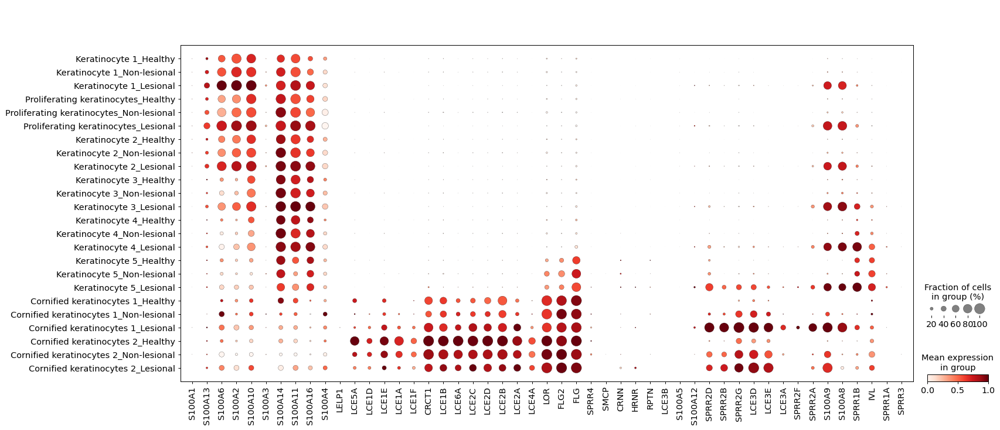

In [56]:
sc.pl.dotplot(temp_ad, edc_genes, 
              groupby=['Cell type granular', 'disease_lesional'], mean_only_expressed=True, vmin=0, standard_scale='var', save='cornified-edc-genes.pdf')